[![Open in Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/MokryYezhik/studying-CNN/blob/master/%5Bhw%5Dautoencoders_final.ipynb)

<p style="align: center;"><img align=center src="https://s8.hostingkartinok.com/uploads/images/2018/08/308b49fcfbc619d629fe4604bceb67ac.jpg" width=500 height=450/></p>

<h3 style="text-align: center;">
<b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Весна 2021</b></h3>

# Autoencoders


# Часть 1. Vanilla Autoencoder (10 баллов)

## 1.1. Подготовка данных (0.5 балла)


In [ ]:
!pip install -U scikit-image

In [ ]:
import skimage
from skimage.transform import resize

skimage.__version__ # > 19v

'0.19.3'

In [ ]:
import random
import numpy as np
from torch.autograd import Variable
from torchvision import datasets
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data_utils
import torch
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from matplotlib import rcParams
rcParams['figure.figsize'] = (15,4)

import os
import pandas as pd

In [ ]:
def set_seed(seed):
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    np.random.seed(seed)
    random.seed(seed)
    #os.environ['PYTHONHASHSEED'] = str(seed)

set_seed(42)

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive/', force_remount=True)

Mounted at /content/gdrive/


In [ ]:
DEVICE = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {DEVICE}')

Selected device: cpu


In [ ]:
PATH = '/content/gdrive/MyDrive/Colab Notebooks/dls advanced/'

def save_model_params(model, model_name):
    torch.save(model.state_dict(), PATH + model_name + '.pth')

def load_model(model, model_name):
    model.load_state_dict(torch.load(PATH + model_name + '.pth', map_location=torch.device(DEVICE)))

In [ ]:
def fetch_dataset(attrs_name = "lfw_attributes.txt",
                      images_name = "lfw-deepfunneled",
                      dx=80,dy=80,
                      dimx=64,dimy=64
    ):

    #download if not exists
    if not os.path.exists(images_name):
        print("images not found, donwloading...")
        os.system("wget http://vis-www.cs.umass.edu/lfw/lfw-deepfunneled.tgz -O tmp.tgz")
        print("extracting...")
        os.system("tar xvzf tmp.tgz && rm tmp.tgz")
        print("done")
        assert os.path.exists(images_name)

    if not os.path.exists(attrs_name):
        print("attributes not found, downloading...")
        os.system("wget http://www.cs.columbia.edu/CAVE/databases/pubfig/download/%s" % attrs_name)
        print("done")

    #read attrs
    df_attrs = pd.read_csv("lfw_attributes.txt",sep='\t',skiprows=1,) 
    df_attrs = pd.DataFrame(df_attrs.iloc[:,:-1].values, columns = df_attrs.columns[1:])


    #read photos
    photo_ids = []
    for dirpath, dirnames, filenames in os.walk(images_name):
        for fname in filenames:
            if fname.endswith(".jpg"):
                fpath = os.path.join(dirpath,fname)
                photo_id = fname[:-4].replace('_',' ').split()
                person_id = ' '.join(photo_id[:-1])
                photo_number = int(photo_id[-1])
                photo_ids.append({'person':person_id,'imagenum':photo_number,'photo_path':fpath})

    photo_ids = pd.DataFrame(photo_ids)
    # print(photo_ids)
    #mass-merge
    #(photos now have same order as attributes)
    df = pd.merge(df_attrs,photo_ids,on=('person','imagenum'))

    assert len(df)==len(df_attrs),"lost some data when merging dataframes"

    # print(df.shape)
    #image preprocessing
    all_photos =df['photo_path'].apply(skimage.io.imread)\
                                .apply(lambda img:img[dy:-dy,dx:-dx])\
                                .apply(lambda img: resize(img,[dimx,dimy]))

    all_photos = np.stack(all_photos.values)#.astype('uint8')
    all_attrs = df.drop(["photo_path","person","imagenum"],axis=1)
    
    return all_photos, all_attrs

In [ ]:
# The following line fetches you two datasets: images, usable for autoencoder training and attributes.
# Those attributes will be required for the final part of the assignment (applying smiles), so please keep them in mind
# from get_dataset import fetch_dataset
data, attrs = fetch_dataset()

images not found, donwloading...
extracting...
done
attributes not found, downloading...
done


/usr/local/lib/python3.7/dist-packages/skimage/io/manage_plugins.py:23: UserWarning: Your installed pillow version is < 8.1.2. Several security issues (CVE-2021-27921, CVE-2021-25290, CVE-2021-25291, CVE-2021-25293, and more) have been fixed in pillow 8.1.2 or higher. We recommend to upgrade this library.
  from .collection import imread_collection_wrapper


In [ ]:
type(data), type(attrs), data.shape, attrs.shape

(numpy.ndarray, pandas.core.frame.DataFrame, (13143, 64, 64, 3), (13143, 73))

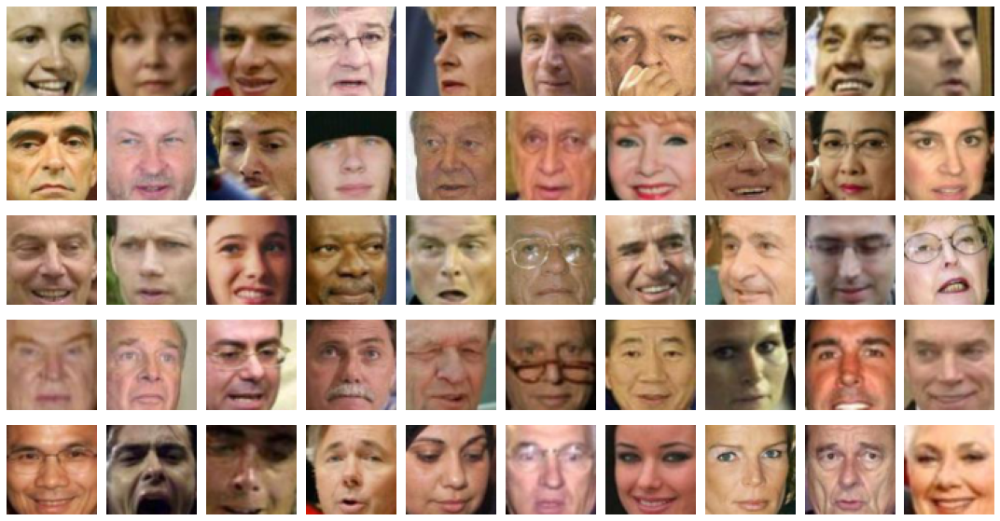

In [ ]:
plt.figure(figsize=(15, 8))
ind = np.random.randint(0, data.shape[0], (50,))

n_row = 5
n_col = 10
for k in range(50):
    plt.subplot(5, 10, k+1)
    plt.imshow(data[ind[k], :])
    plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
attrs.head()

,Male,Asian,White,Black,Baby,Child,Youth,Middle Aged,Senior,Black Hair,...,Pale Skin,5 o' Clock Shadow,Strong Nose-Mouth Lines,Wearing Lipstick,Flushed Face,High Cheekbones,Brown Eyes,Wearing Earrings,Wearing Necktie,Wearing Necklace
0,1.568346,-1.889043,1.737203,-0.929729,-1.471799,-0.19558,-0.835609,-0.351468,-1.012533,-0.719593,...,0.361738,1.166118,-1.164916,-1.13999,-2.371746,-1.299932,-0.414682,-1.144902,0.694007,-0.826609
1,0.169851,-0.982408,0.422709,-1.282184,-1.36006,-0.867002,-0.452293,-0.197521,-0.956073,-0.802107,...,-0.832036,-0.39768,0.87416,-0.945431,-0.268649,-0.006244,-0.030406,-0.480128,0.66676,-0.496559
2,0.997749,-1.364195,-0.157377,-0.756447,-1.891825,-0.871526,-0.862893,0.031445,-1.341523,-0.090037,...,1.549743,1.884745,-0.999765,-1.359858,-1.912108,-1.095634,0.915126,-0.572332,0.144262,-0.841231
3,1.122719,-1.997799,1.916144,-2.514214,-2.580071,-1.404239,0.057551,0.000196,-1.273512,-1.431462,...,0.567822,-0.176089,1.108125,-1.600944,-3.264613,0.813418,0.308631,-0.848693,0.475941,-0.447025
4,1.078214,-2.008098,1.676211,-2.278056,-2.651845,-1.348408,0.649089,0.017656,-1.889111,-1.857213,...,-1.461474,-0.955283,0.119113,-1.128176,-3.161048,0.08268,-0.439614,-0.359859,-0.760774,-0.410152


In [ ]:
attrs.columns

Index(['Male', 'Asian', 'White', 'Black', 'Baby', 'Child', 'Youth',
       'Middle Aged', 'Senior', 'Black Hair', 'Blond Hair', 'Brown Hair',
       'Bald', 'No Eyewear', 'Eyeglasses', 'Sunglasses', 'Mustache', 'Smiling',
       'Frowning', 'Chubby', 'Blurry', 'Harsh Lighting', 'Flash',
       'Soft Lighting', 'Outdoor', 'Curly Hair', 'Wavy Hair', 'Straight Hair',
       'Receding Hairline', 'Bangs', 'Sideburns', 'Fully Visible Forehead',
       'Partially Visible Forehead', 'Obstructed Forehead', 'Bushy Eyebrows',
       'Arched Eyebrows', 'Narrow Eyes', 'Eyes Open', 'Big Nose',
       'Pointy Nose', 'Big Lips', 'Mouth Closed', 'Mouth Slightly Open',
       'Mouth Wide Open', 'Teeth Not Visible', 'No Beard', 'Goatee',
       'Round Jaw', 'Double Chin', 'Wearing Hat', 'Oval Face', 'Square Face',
       'Round Face', 'Color Photo', 'Posed Photo', 'Attractive Man',
       'Attractive Woman', 'Indian', 'Gray Hair', 'Bags Under Eyes',
       'Heavy Makeup', 'Rosy Cheeks', 'Shiny Skin', 'Pa

In [ ]:
print(f'Интервал значений пикселей изображений: [{np.min(data)}, {np.max(data)}]')

Интервал значений пикселей изображений: [0.0, 1.0]



Разбейте выборку картинок на train и val, выведите несколько картинок в output, чтобы посмотреть, как они выглядят, и приведите картинки к тензорам pytorch, чтобы можно было скормить их сети:

In [ ]:
# <тут Ваш код>

idx = np.random.choice(len(data), len(data), False)
train_idx, val_idx = np.split(idx, [9857]) # train - 75%
train_idx.shape, val_idx.shape

((9857,), (3286,))

In [ ]:
batch_size = 128

train_data = DataLoader(list(np.rollaxis(data[train_idx], 3, 1)),
                        batch_size=batch_size,
                        shuffle=True,
                        drop_last=True)
val_data = DataLoader(list(np.rollaxis(data[val_idx], 3, 1)),
                      batch_size=batch_size, 
                      shuffle=False)

## 1.2. Архитектура модели (1.5 балла)
В этом разделе мы напишем и обучем обычный автоэнкодер.



<img src="https://www.notion.so/image/https%3A%2F%2Fs3-us-west-2.amazonaws.com%2Fsecure.notion-static.com%2F4b8adf79-8e6a-4b7d-9061-8617a00edbb1%2F__2021-04-30__14.53.33.png?table=block&id=56f187b4-279f-4208-b1ed-4bda5f91bfc0&width=2880&userId=3b1b5e32-1cfb-4b0f-8705-5a524a8f56e3&cache=v2" alt="Autoencoder">


^ напомню, что автоэнкодер выглядит вот так

In [ ]:
dim_code = 10 # <your code here> # выберите размер латентного вектора

Реализуем autoencoder. Архитектуру (conv, fully-connected, ReLu, etc) можете выбирать сами. Экспериментируйте!

In [ ]:
class ConvAE(nn.Module):
    def __init__(self, dim_code: int = 10, img_size: int = 64, inference: bool = True):
        # <определите архитектуры encoder и decoder
        # помните, у encoder должны быть два "хвоста", 
        # т.е. encoder должен кодировать картинку в 2 переменные -- mu и logsigma>

        super().__init__()

        self.img_size = img_size
        self.dim_code = dim_code
        self.inference = inference

        # encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, stride=2, padding=1), # B x 32 x 32 x 32
            nn.BatchNorm2d(32),
            nn.LeakyReLU(),
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=2, padding=1), # B x 64 x 16 x 16
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=2, padding=1), # B x 128 x 8 x 8
            nn.BatchNorm2d(128),
            nn.LeakyReLU(),
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=2, padding=1), # B x 256 x 4 x 4
            nn.BatchNorm2d(256),
            nn.LeakyReLU(),
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, stride=2, padding=1), # B x 512 x 2 x 2
            nn.BatchNorm2d(512),
            nn.LeakyReLU(),

        )

        self.encoder_output = nn.Linear(512*2*2, self.dim_code)
        self.decoder_input = nn.Linear(self.dim_code, 512*2*2)

        # decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=3, stride=2, padding=1, output_padding=1), # B x 256 x 4 x 4
            nn.BatchNorm2d(256),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=3, stride=2, padding=1, output_padding=1), # B x 128 x 8 x 8
            nn.BatchNorm2d(128),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=3, stride=2, padding=1, output_padding=1), # B x 64 x 16 x 16
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(in_channels=64, out_channels=32, kernel_size=3, stride=2, padding=1, output_padding=1), # B x 32 x 32 x 32
            nn.BatchNorm2d(32),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(in_channels=32, out_channels=32, kernel_size=3, stride=2, padding=1, output_padding=1), # B x 32 x 64 x 64
            nn.BatchNorm2d(32),
            nn.LeakyReLU(),
            nn.Conv2d(in_channels=32, out_channels=3, kernel_size=3, padding=1) # B x 1 x 28 x 28
        )

    def encode(self, x):
        # <реализуйте forward проход энкодера
        # в качестве ваозвращаемых переменных -- mu, logsigma и класс картинки>

        x = self.encoder(x) # B x 512 x 2 x 2
        x = x.view(-1, 512*2*2) # B x 512*2*2
        latent_code = self.encoder_output(x) # B x dim_code
        return latent_code
    
    def decode(self, z):
        # <реализуйте forward проход декодера
        # в качестве возвращаемой переменной -- reconstruction>
        # B x dim_code

        z = self.decoder_input(z) # B x 512*2*2
        z = z.view(-1, 512, 2, 2) # B x 512 x 2 x 2 
        reconstruction = self.decoder(z) # B x 3 x 64 x 64
        reconstruction = torch.sigmoid(reconstruction)

        return reconstruction

    def forward(self, x):
        # <используя encode и decode, реализуйте forward проход автоэнкодера
        # в качестве ваозвращаемых переменных -- mu, logsigma и reconstruction>
        # B x C x W x H

        latent_code = self.encode(x)
        reconstruction = self.decode(latent_code)

        return reconstruction, latent_code

## 1.3 Обучение (2 балла)

Осталось написать код обучения автоэнкодера. При этом было бы неплохо в процессе иногда смотреть, как автоэнкодер реконструирует изображения на данном этапе обучения. Наример, после каждой эпохи (прогона train выборки через автоэекодер) можно смотреть, какие реконструкции получились для каких-то изображений val выборки.

А, ну еще было бы неплохо выводить графики train и val лоссов в процессе тренировки =)

In [ ]:
from tqdm.autonotebook import tqdm, trange
from time import time

# <тут Ваш код тренировки автоэнкодера>
def train_model(model, train_loader, val_loader, loss_func, optimizer, n_epochs=30):
    losses = {'train': [], 'val': []}

    tic = time()
    pbar = trange(n_epochs, desc='Epoch:')

    for epoch in pbar:
        running_loss = 0

        model.train()
        for X_batch in tqdm(train_loader, leave=False, desc=f"train iter:"):
            X_batch = X_batch.to(DEVICE).float()

            optimizer.zero_grad()
            reconstruction, latent_code = model(X_batch)
            loss = loss_func(reconstruction, X_batch)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

        epoch_loss = running_loss / len(train_loader.dataset)
        losses['train'].append(epoch_loss)
        pbar.set_description('train Loss: {:.4f}'.format(epoch_loss))
        running_loss = 0


        n_visuals = 10
        visual = [0] * n_visuals
        i = 0

        model.eval()
        with torch.no_grad():
            for X_batch in tqdm(val_loader, leave=False, desc=f"val iter:"):
                X_batch = X_batch.to(DEVICE).float()
                reconstruction, latent_code = model(X_batch)
                # print(X_batch.shape, reconstruction.shape)
                loss = loss_func(reconstruction, X_batch)
                running_loss += loss.item()

                if i < 10:
                  visual[i] = (X_batch[i], reconstruction[i])
                  i += 1

        
        epoch_loss = running_loss / len(val_loader.dataset)
        losses['val'].append(epoch_loss)
        pbar.set_description('val Loss: {:.4f}'.format(epoch_loss))

        # Visualize tools
        #clear_output(wait=True)
        for k in range(n_visuals):
            plt.subplot(2, n_visuals, k+1)
            plt.imshow(np.rollaxis(visual[k][0].detach().cpu().numpy(), 0, 3))
            plt.title('Real')
            plt.axis('off')

            plt.subplot(2, n_visuals, k+n_visuals+1)
            plt.imshow(np.rollaxis(visual[k][1].detach().cpu().numpy(), 0, 3))
            plt.title('Output')
            plt.axis('off')
        plt.suptitle('%d / %d - loss: %f' % (epoch+1, n_epochs, epoch_loss))
        plt.show()


    toc = time()
    time_elapsed = toc - tic
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))

    return model, losses

In [ ]:
conv_AE = ConvAE(dim_code=32).to(DEVICE)

criterion = nn.MSELoss(reduction='sum') # <loss>
optimizer = torch.optim.Adam(conv_AE.parameters(), lr=0.001) # <Ваш любимый оптимизатор>
scheduler = torch.optim.lr_scheduler.MultiplicativeLR(optimizer, lr_lambda=lambda epoch: 0.5 ** epoch)

Epoch::   0%|          | 0/30 [00:00<?, ?it/s]

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

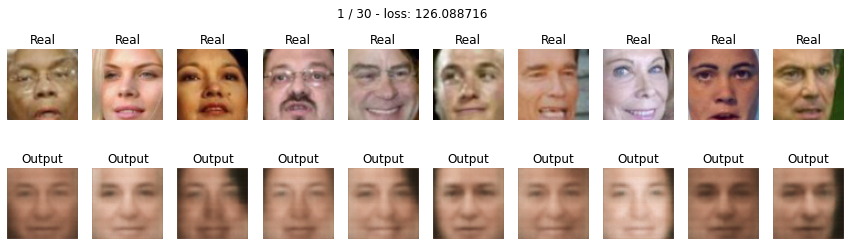

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

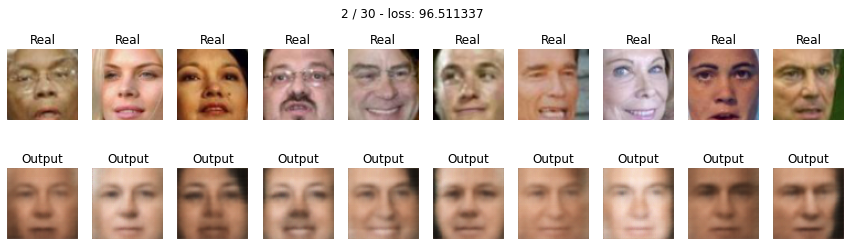

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

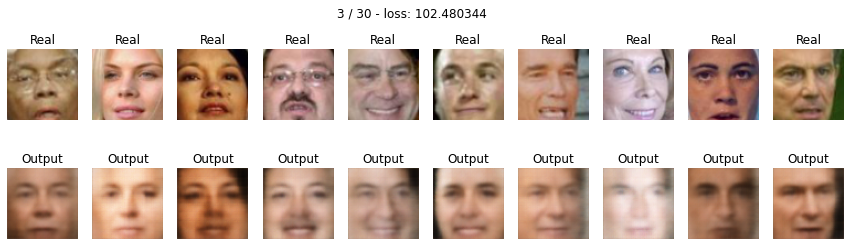

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

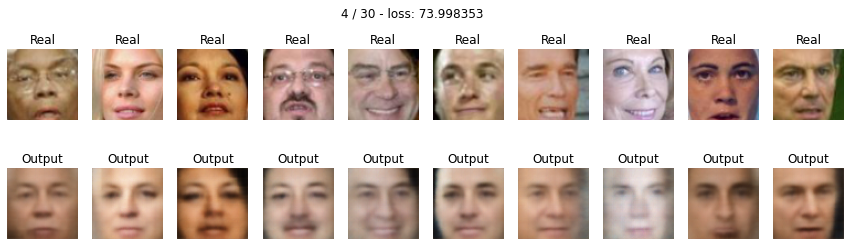

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

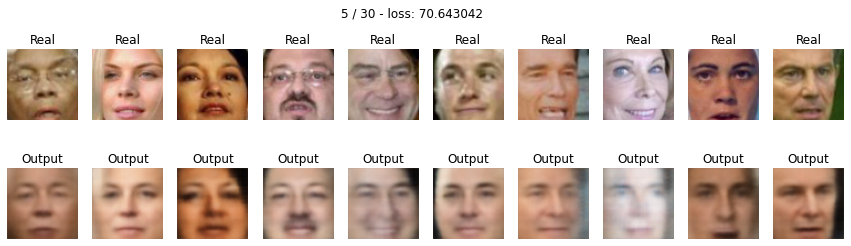

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

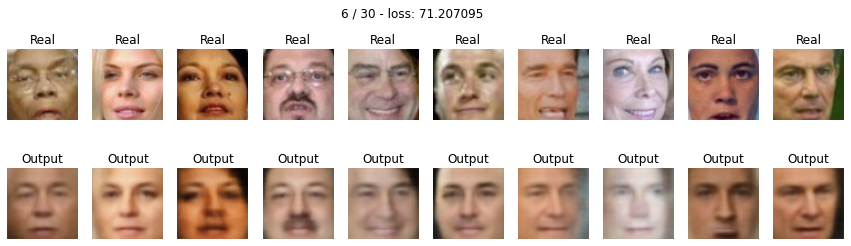

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

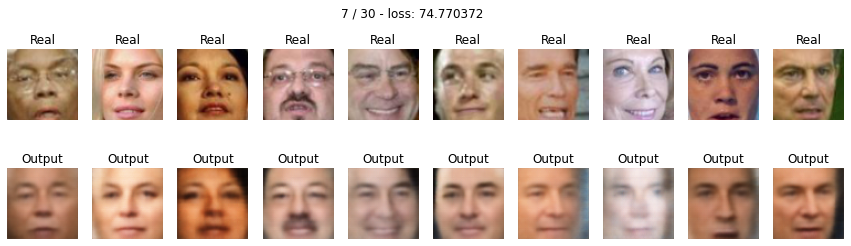

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

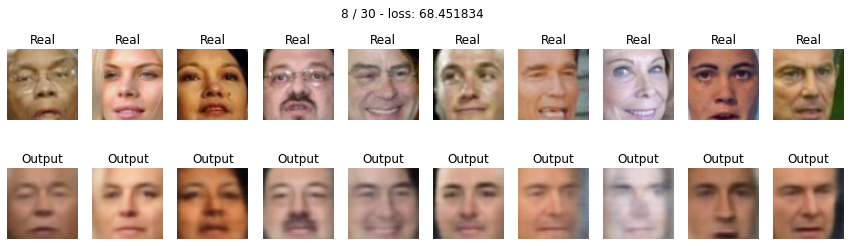

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

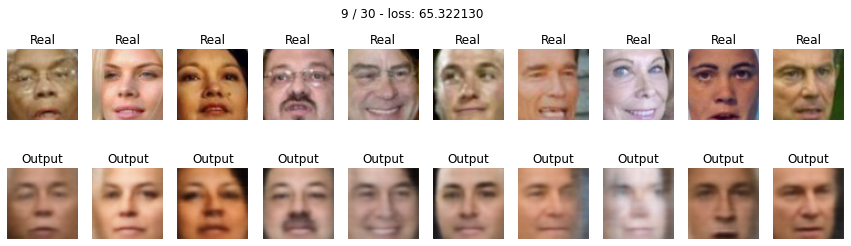

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

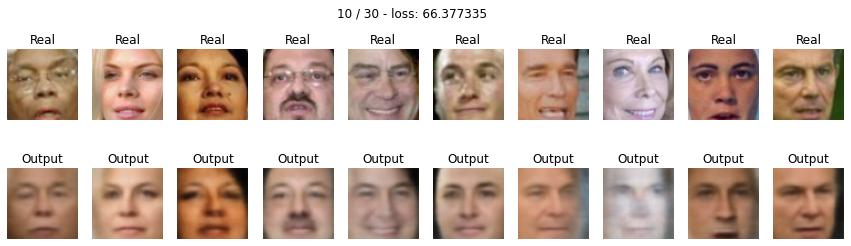

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

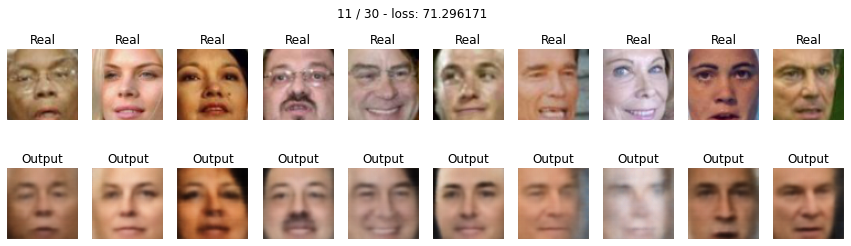

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

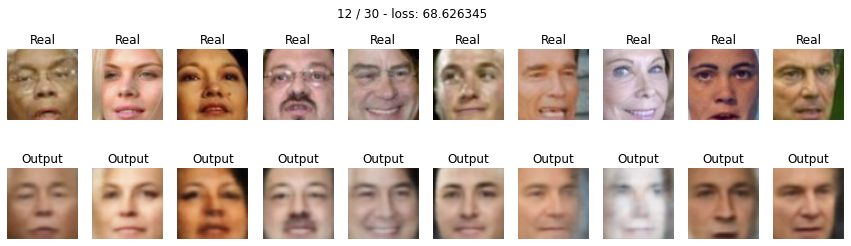

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

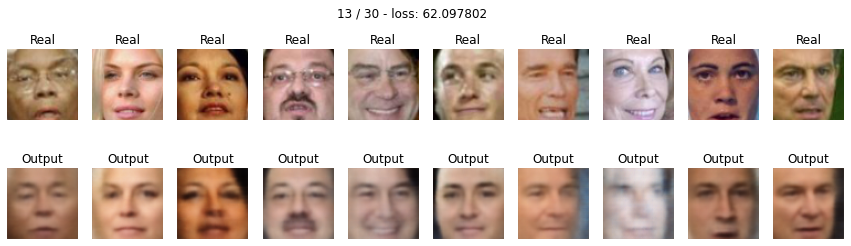

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

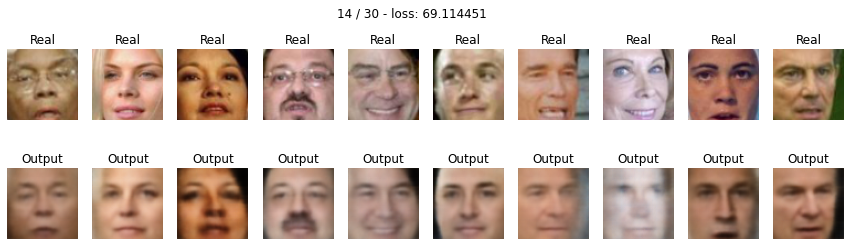

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

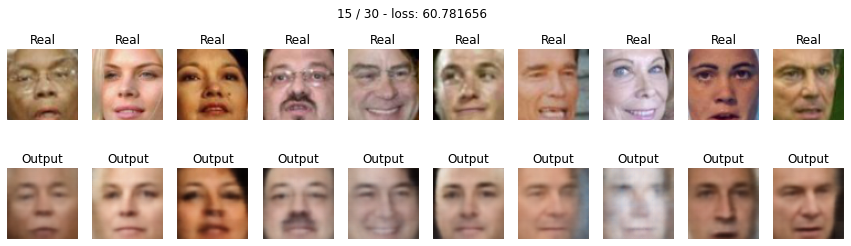

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

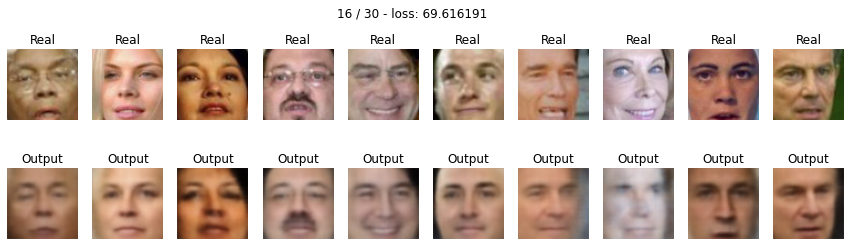

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

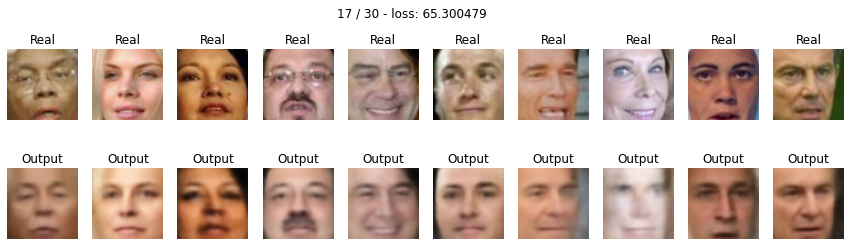

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

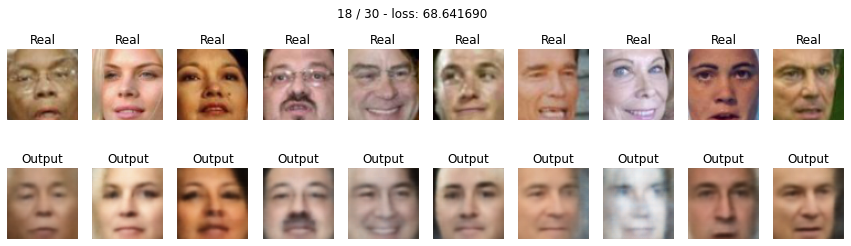

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

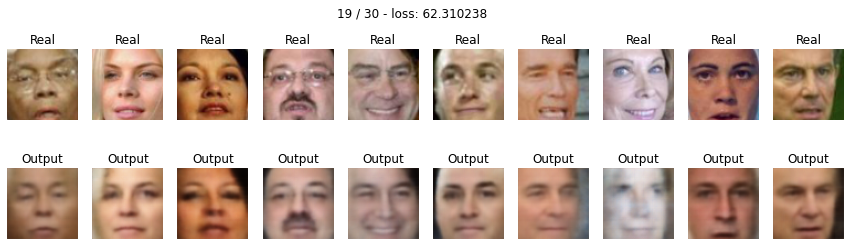

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

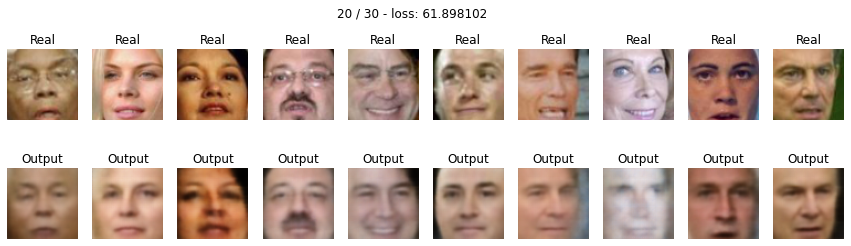

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

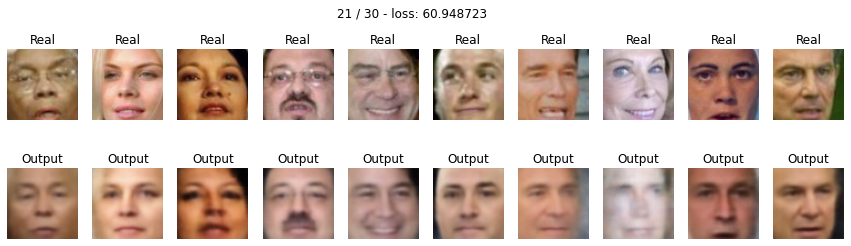

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

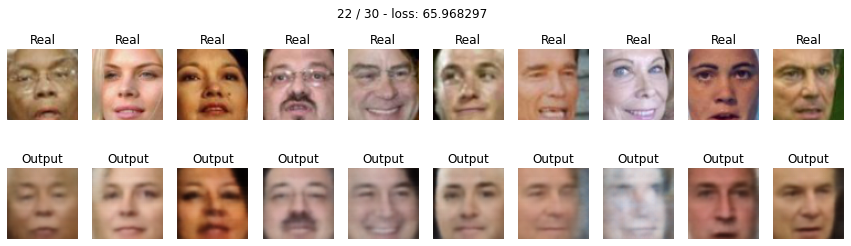

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

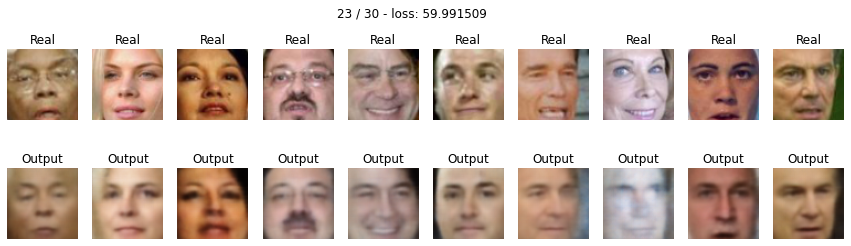

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

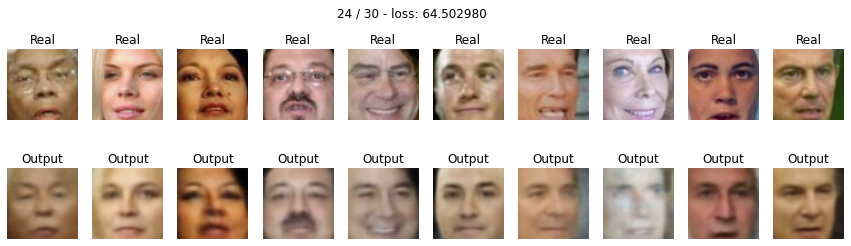

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

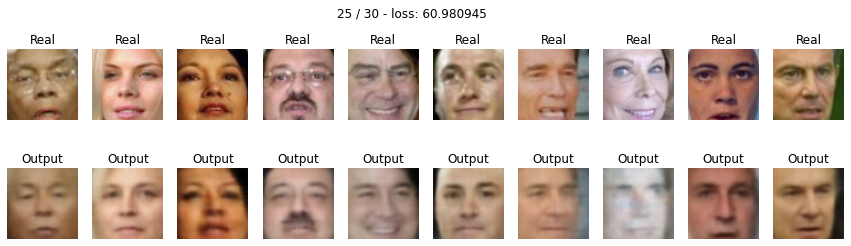

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

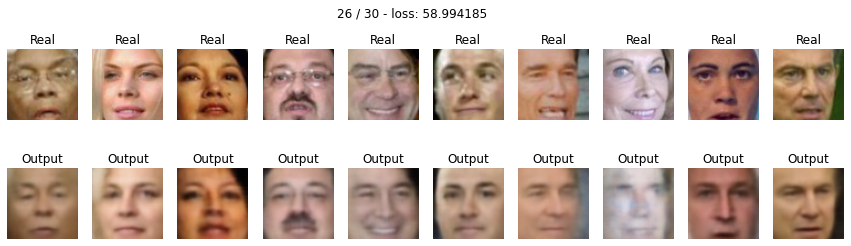

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

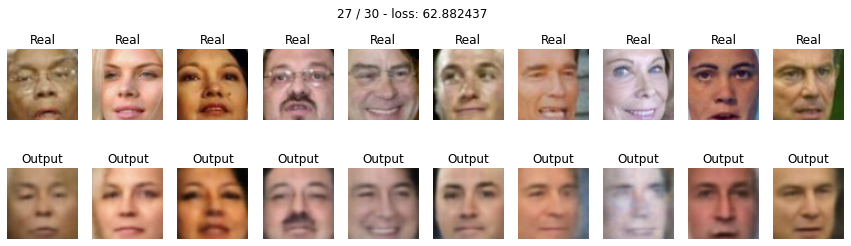

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

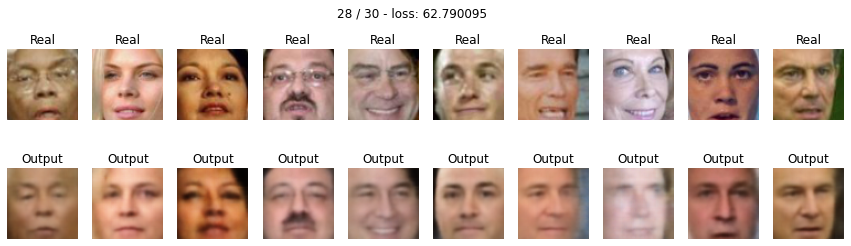

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

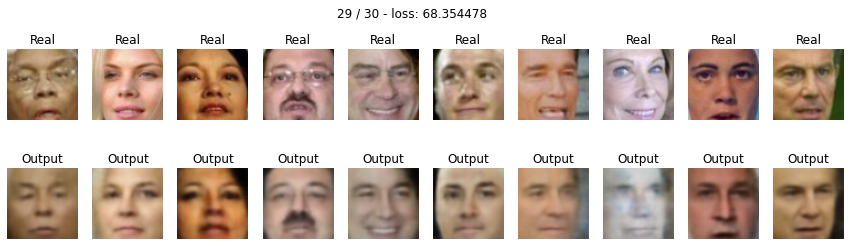

train iter::   0%|          | 0/309 [00:00<?, ?it/s]

val iter::   0%|          | 0/103 [00:00<?, ?it/s]

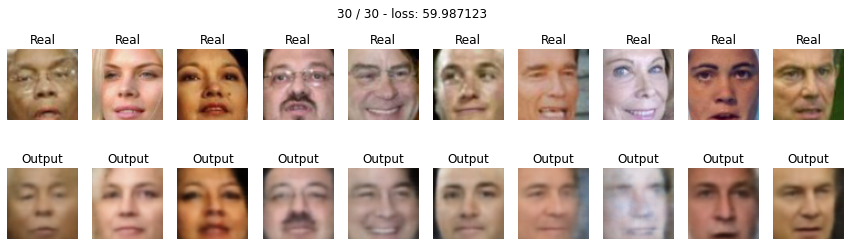

Training complete in 101m 14s


In [ ]:
conv_AE, losses = train_model(conv_AE, train_data, val_data, criterion, optimizer, n_epochs=30)
save_model_params(conv_AE, model_name='conv_AE_04_32')

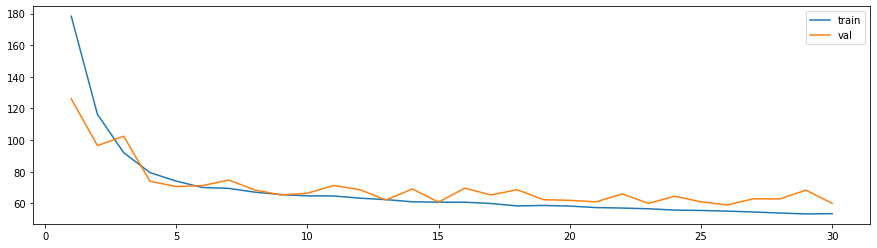

In [ ]:
x_range = range(1,len(losses['train'])+1)
plt.plot(x_range, losses['train'], label='train')
plt.plot(x_range, losses['val'], label='val')
plt.legend()
plt.show()

In [ ]:
conv_AE = ConvAE(dim_code=32).to(DEVICE)
load_model(conv_AE, model_name='conv_AE_04_32')

Давайте посмотрим, как наш тренированный автоэекодер кодирует и восстанавливает картинки:

In [ ]:
# < тут Ваш код: выведите первые Х картинок и их реконструкций из val выборки на экран>

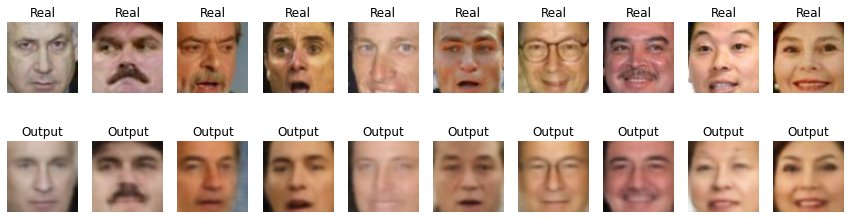

In [ ]:
with torch.no_grad():
    for X_batch in val_data:
        X_batch = X_batch.to(DEVICE).float()

        reconstruction, latent_code = conv_AE(X_batch)

        n = 10
        for k in range(n):
            plt.subplot(2, n, k+1)
            plt.imshow(np.rollaxis(X_batch[k].detach().cpu().numpy(), 0, 3))
            plt.title('Real')
            plt.axis('off')

            plt.subplot(2, n, k+n+1)
            plt.imshow(np.rollaxis(reconstruction[k].detach().cpu().numpy(), 0, 3))
            plt.title('Output')
            plt.axis('off')
        plt.show()
        
        break

весьма средненький результат, конечно

Not bad, right? 

## 1.4. Sampling (2 балла)

Давайте теперь будем не просто брать картинку, прогонять ее через автоэекодер и получать реконструкцию, а попробуем создать что-то НОВОЕ

Давайте возьмем и подсунем декодеру какие-нибудь сгенерированные нами векторы (например, из нормального распределения) и посмотрим на результат реконструкции декодера:

__Подсказка:__ Если вместо лиц у вас выводится непонятно что, попробуйте посмотреть, как выглядят латентные векторы картинок из датасета. Так как в обучении нейронных сетей есть определенная доля рандома, векторы латентного слоя могут быть распределены НЕ как `np.random.randn(25, <latent_space_dim>)`. А чтобы у нас получались лица при запихивании вектора декодеру, вектор должен быть распределен так же, как латентные векторы реальных фоток. Так что в таком случае придется рандом немного подогнать.

In [ ]:
latent_codes = []

conv_AE.eval()
with torch.no_grad():
    for X_batch in train_data:
        X_batch = X_batch.to(DEVICE).float()

        _, latent_code = conv_AE(X_batch)
        latent_codes.append(latent_code)

latent_codes = torch.cat(latent_codes)

print('mean vector: ', latent_codes.mean(dim=0))
print('std vector: ', latent_codes.std(dim=0))

mean vector:  tensor([ 2.6592e-01,  1.1862e+00, -1.5201e+00,  2.2200e+00,  7.3517e-01,
        -5.5936e+00,  4.5346e+00,  2.3637e-01, -1.1664e+00, -9.8928e-01,
        -2.9667e+00,  4.4918e+00, -8.2104e-01,  1.5304e+00, -6.9451e+00,
        -1.8640e+00, -4.6592e-01,  8.9971e-01, -2.9186e+00,  9.8302e-01,
         1.0162e+00,  1.3305e+00,  1.3463e+00, -2.1151e+00, -1.0488e+01,
         1.0622e+00, -2.7184e-02,  3.5506e-03, -5.4732e+00,  2.2827e+00,
        -5.4634e-01, -9.7506e-01])
std vector:  tensor([ 7.0967,  7.0111,  7.1578, 10.0597,  8.1015,  6.8507, 11.5474,  7.3467,
        10.0667,  7.1657,  7.6838,  8.1243,  7.0028,  7.2795,  8.8457,  8.0411,
         7.8770,  7.9211,  8.5663,  8.3342,  7.6741,  7.1214,  7.8810,  8.7799,
        12.6885,  8.5717,  8.3356,  7.4009,  7.4098,  8.4801,  6.7609,  7.4551])


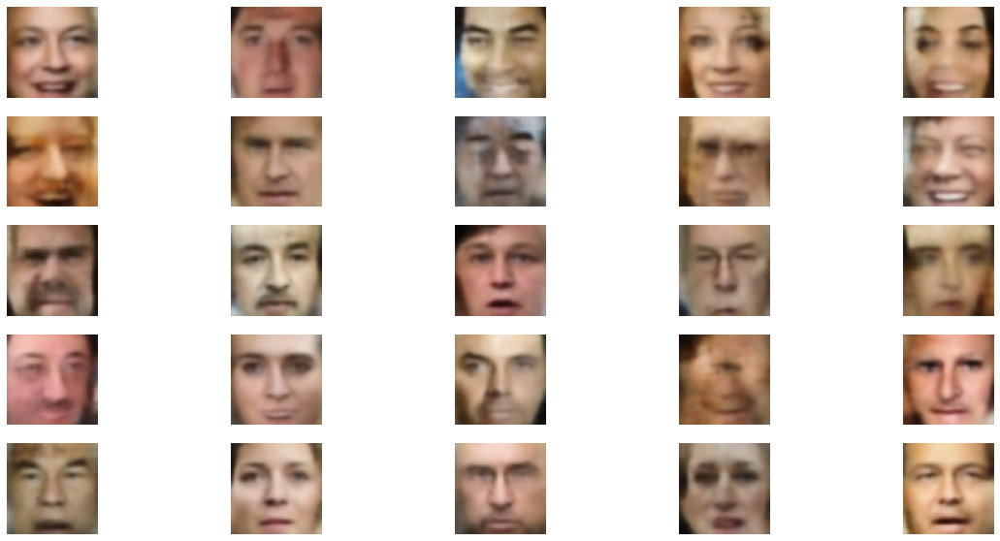

In [ ]:
# сгенерируем 25 рандомных векторов размера latent_space
dim_code = 32

z = torch.tensor(np.random.randn(25, dim_code))
z = z * latent_codes.std(dim=0) + latent_codes.mean(dim=0)
z = z.unsqueeze(1).to(DEVICE).float()
output = conv_AE.decode(z) # <скормите z декодеру>
#<выведите тут полученные картинки>

plt.figure(figsize=(20,10))
n = 25
n_rows = 5
n_cols = 5
for k in range(n):
    plt.subplot(n_rows, n_cols, k+1)
    plt.imshow(np.rollaxis(output[k].detach().cpu().numpy(), 0, 3))
    #plt.title('Output')
    plt.axis('off')
plt.show()

## Time to make fun! (4 балла)

Давайте научимся пририсовывать людям улыбки =)

<img src="https://i.imgur.com/tOE9rDK.png" alt="linear" width="700" height="400">

План такой:

1. Нужно выделить "вектор улыбки": для этого нужно из выборки изображений найти несколько (~15) людей с улыбками и столько же без.

Найти людей с улыбками вам поможет файл с описанием датасета, скачанный вместе с датасетом. В нем указаны имена картинок и присутствубщие атрибуты (улыбки, очки...)

2. Вычислить латентный вектор для всех улыбающихся людей (прогнать их через encoder) и то же для всех грустненьких

3. Вычислить, собственно, вектор улыбки -- посчитать разность между средним латентным вектором улыбающихся людей и средним латентным вектором грустных людей

4. А теперь приделаем улыбку грустному человеку: добавим полученный в пункте 3 вектор к латентному вектору грустного человека и прогоним полученный вектор через decoder. Получим того же человека, но уже не грустненького!

In [ ]:
# индексы картинок с улбыющимися / не улыбающимися (а также мужчинами / женщинами)
with_no_smile = attrs['Smiling'].sort_values().index[:1000]
with_smile = attrs['Smiling'].sort_values(ascending=False).index[:1000]
women = attrs['Male'].sort_values().index[:1000]
men = attrs['Male'].sort_values(ascending=False).index[:1000]

In [ ]:
# те индексы, которые входят в обучающую выборку
np.intersect1d(with_smile, train_idx).shape, np.intersect1d(with_no_smile, train_idx).shape, \
np.intersect1d(women, train_idx).shape, np.intersect1d(men, train_idx).shape

((736,), (749,), (745,), (757,))

In [ ]:
# индексы картинок с улбыющимися / не улыбающимися (а также мужчинами / женщинами)
# из обучающей выборки
with_smile = np.intersect1d(with_smile, train_idx)[:700]
with_no_smile = np.intersect1d(with_no_smile, train_idx)[:700]
women = np.intersect1d(women, train_idx)[:700]
men = np.intersect1d(men, train_idx)[:700]

In [ ]:
# латентные представления картинок с улыбками / без улыбок, мужчин / женщин
data_with_smile = torch.tensor(np.moveaxis(data[with_smile], 3, 1)).float()
_, latent_code_with_smile = conv_AE(data_with_smile)

In [ ]:
data_with_no_smile = torch.tensor(np.moveaxis(data[with_no_smile], 3, 1)).float()
_, latent_code_with_no_smile = conv_AE(data_with_no_smile)

In [ ]:
data_women = torch.tensor(np.moveaxis(data[women], 3, 1)).float()
_, latent_code_women = conv_AE(data_women)

In [ ]:
data_men = torch.tensor(np.moveaxis(data[men], 3, 1)).float()
_, latent_code_men = conv_AE(data_men)

In [ ]:
# средние значения латентных представлений векторов атрибутов
mean_smile = latent_code_with_smile.mean(dim=0)
mean_no_smile = latent_code_with_no_smile.mean(dim=0)
mean_women = latent_code_women.mean(dim=0)
mean_men = latent_code_men.mean(dim=0)
women_vector = latent_code_women.mean(dim=0)
vector_smile = mean_smile - mean_no_smile
vector_women = mean_women - mean_men
vector_smile_gender = vector_smile - vector_women

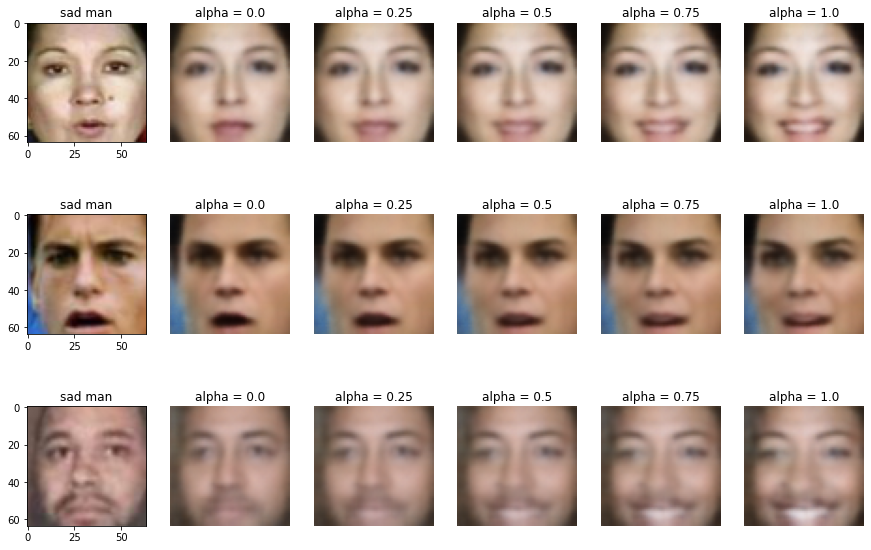

In [ ]:
n_row = 3
n_col = 6

plt.figure(figsize=(15, 10))
for idx, img_idx in enumerate([4677, 471, 2]):

    sad_man = torch.tensor(np.moveaxis(data[img_idx], 2, 0)).float().unsqueeze(0)
    recon_sad_man, latent_code_sad_man = conv_AE(sad_man)
    latent_code_new_man = latent_code_sad_man + vector_smile
    new_man = conv_AE.decode(latent_code_new_man)

    plt.subplot(n_row, n_col, n_col*idx+1)
    plt.imshow(np.rollaxis(sad_man[0].detach().cpu().numpy(), 0, 3));
    plt.title('sad man');

    for i, alpha in enumerate(np.linspace(0, 1, 5)):
        man = (1-alpha)*recon_sad_man[0] + alpha*new_man[0]
        plt.subplot(n_row, n_col, n_col*idx+i+2)
        plt.imshow(np.rollaxis(man.detach().cpu().numpy(), 0, 3));
        plt.title(f'alpha = {alpha}');
        plt.axis('off');

plt.show()

Добавление вектора улыбки приводит так же к "переходу к женщине". Видимо, большая часть улыбающихся людей является женщинами. Попробуем так же вычесть латентный ветор, кодирующий жегщин.

При этом вектор улыбки несолько "слабеет".

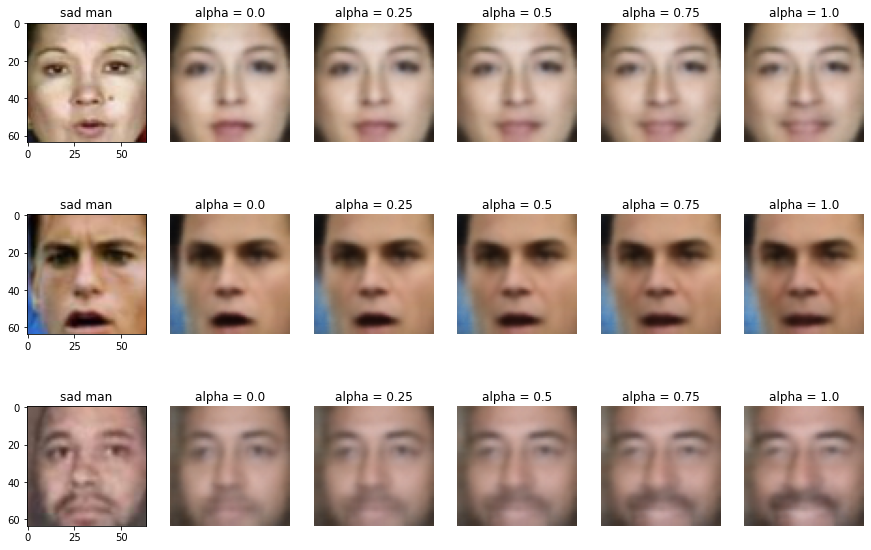

In [ ]:
n_row = 3
n_col = 6

plt.figure(figsize=(15, 10))
for idx, img_idx in enumerate([4677, 471, 2]):

    sad_man = torch.tensor(np.moveaxis(data[img_idx], 2, 0)).float().unsqueeze(0)
    recon_sad_man, latent_code_sad_man = conv_AE(sad_man)
    latent_code_new_man = latent_code_sad_man + vector_smile_gender
    new_man = conv_AE.decode(latent_code_new_man)

    plt.subplot(n_row, n_col, n_col*idx+1)
    plt.imshow(np.rollaxis(sad_man[0].detach().cpu().numpy(), 0, 3));
    plt.title('sad man');

    for i, alpha in enumerate(np.linspace(0, 1, 5)):
        man = (1-alpha)*recon_sad_man[0] + alpha*new_man[0]
        plt.subplot(n_row, n_col, n_col*idx+i+2)
        plt.imshow(np.rollaxis(man.detach().cpu().numpy(), 0, 3));
        plt.title(f'alpha = {alpha}');
        plt.axis('off');

plt.show()

Вуаля! Вы восхитительны!

Теперь вы можете пририсовывать людям не только улыбки, но и много чего другого -- закрывать/открывать глаза, пририсовывать очки... в общем, все, на что хватит фантазии и на что есть атрибуты в `all_attrs`:)

# Часть 2: Variational Autoencoder (10 баллов) 

Займемся обучением вариационных автоэнкодеров — проапгрейженной версии AE. Обучать будем на датасете MNIST, содержащем написанные от руки цифры от 0 до 9

In [ ]:
from torchvision import transforms

batch_size = 128
# MNIST Dataset
train_dataset = datasets.MNIST(root='./mnist_data/', train=True, transform=transforms.ToTensor(), download=True)
test_dataset = datasets.MNIST(root='./mnist_data/', train=False, transform=transforms.ToTensor(), download=False)

# Data Loader (Input Pipeline)
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./mnist_data/MNIST/raw/train-images-idx3-ubyte.gz to ./mnist_data/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./mnist_data/MNIST/raw/train-labels-idx1-ubyte.gz to ./mnist_data/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./mnist_data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./mnist_data/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./mnist_data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./mnist_data/MNIST/raw



## 2.1 Архитектура модели и обучение (2 балла)

Реализуем VAE. Архитектуру (conv, fully-connected, ReLu, etc) можете выбирать сами. Рекомендуем пользоваться более сложными моделями, чем та, что была на семинаре:) Экспериментируйте!

In [ ]:
class ConvVAE(nn.Module):
    def __init__(self, dim_code: int = 4, img_size: int = 28, inference: bool = True):
        # <определите архитектуры encoder и decoder
        # помните, у encoder должны быть два "хвоста", 
        # т.е. encoder должен кодировать картинку в 2 переменные -- mu и logsigma>

        super().__init__()

        self.img_size = img_size
        self.dim_code = dim_code
        self.inference = inference

        # self.embedded_class = nn.Linear(self.class_num, self.img_size*self.img_size)

        # encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels=1, out_channels=32, kernel_size=3, stride=2, padding=1), # B x 32 x 14 x 14
            nn.BatchNorm2d(32),
            nn.LeakyReLU(),
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=2, padding=1), # B x 64 x 7 x 7
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=2, padding=1), # B x 128 x 4 x 4
            nn.BatchNorm2d(128),
            nn.LeakyReLU(),
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=2, padding=1), # B x 256 x 2 x 2
            nn.BatchNorm2d(256),
            nn.LeakyReLU()
        )

        self.fc_mu = nn.Linear(256*2*2, self.dim_code)
        self.fc_logsigma = nn.Linear(256*2*2, self.dim_code)

        self.decoder_input = nn.Linear(self.dim_code, 256*2*2)

        # decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=3, stride=2, padding=1, output_padding=1), # B x 128 x 4 x 4
            nn.BatchNorm2d(128),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=3, stride=2, padding=1, output_padding=0), # B x 64 x 7 x 7
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(in_channels=64, out_channels=32, kernel_size=3, stride=2, padding=1, output_padding=1), # B x 32 x 14 x 14
            nn.BatchNorm2d(32),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(in_channels=32, out_channels=32, kernel_size=3, stride=2, padding=1, output_padding=1), # B x 32 x 28 x 28
            nn.BatchNorm2d(32),
            nn.LeakyReLU(),
            nn.Conv2d(in_channels=32, out_channels=1, kernel_size=3, padding=1) # B x 1 x 28 x 28
        )

    def encode(self, x):
        # <реализуйте forward проход энкодера
        # в качестве ваозвращаемых переменных -- mu, logsigma и класс картинки>

        #y = self.embedded_class(y) # B x 28*28
        #y = y.view(-1, 1, self.img_size, self.img_size) # B x 1 x 28 x 28
        #x = torch.cat([x, y], dim=1) # in classes
        x = self.encoder(x) # B x 256 x 2 x 2
        x = x.view(-1, 256*2*2)
        
        mu = self.fc_mu(x) # B x dim_code
        logsigma = self.fc_logsigma(x) # B x dim_code
        return mu, logsigma
    
    def gaussian_sampler(self, mu, logsigma):
        if self.inference:
            if self.training:
                # <засемплируйте латентный вектор из нормального распределения с параметрами mu и sigma>

                # Reparameterization trick to sample from N(mu, var) from N(0,1)
                std = torch.exp(0.5 * logsigma)
                eps = torch.randn_like(std) #  sample from N(0,1)
                sample = mu + (eps * std)
                return sample
            else:
                # на инференсе возвращаем не случайный вектор из нормального распределения, а центральный -- mu. 
                # на инференсе выход автоэнкодера должен быть детерминирован.
                return mu
        else:
            std = torch.exp(0.5 * logsigma)
            eps = torch.randn_like(std) #  sample from N(0,1)
            sample = mu + (eps * std)
            return sample
    
    def decode(self, z):
        # <реализуйте forward проход декодера
        # в качестве возвращаемой переменной -- reconstruction>
        # B x dim_code

        z = self.decoder_input(z) # B x 256*2*2
        z = z.view(-1, 256, 2, 2) # B x 256 x 2 x 2 
        reconstruction = self.decoder(z) # B x 1 x 28 x 28
        reconstruction = torch.sigmoid(reconstruction)
        
        return reconstruction

    def forward(self, x):
        # <используя encode и decode, реализуйте forward проход автоэнкодера
        # в качестве ваозвращаемых переменных -- mu, logsigma и reconstruction>
        # B x C x W x H

        mu, logsigma = self.encode(x)
        z = self.gaussian_sampler(mu, logsigma)
        reconstruction = self.decode(z)

        return reconstruction, mu, logsigma

Определим лосс и его компоненты для VAE:

Надеюсь, вы уже прочитали материал в towardsdatascience (или еще где-то) про VAE и знаете, что лосс у VAE состоит из двух частей: KL и log-likelihood.

Общий лосс будет выглядеть так:

$$\mathcal{L} = -D_{KL}(q_{\phi}(z|x)||p(z)) + \log p_{\theta}(x|z)$$

Формула для KL-дивергенции:

$$D_{KL} = -\frac{1}{2}\sum_{i=1}^{dimZ}(1+log(\sigma_i^2)-\mu_i^2-\sigma_i^2)$$

В качестве log-likelihood возьмем привычную нам кросс-энтропию.

In [ ]:
def KL_divergence(mu, logsigma):
    """
    часть функции потерь, которая отвечает за "близость" латентных представлений разных людей
    """
    # <напишите код для KL-дивергенции, пользуясь формулой выше>
    loss = -0.5 * torch.sum(1 + logsigma - mu.pow(2) - logsigma.exp())
    return loss

def log_likelihood(x, reconstruction):
    """
    часть функции потерь, которая отвечает за качество реконструкции (как mse в обычном autoencoder)
    """
    loss = nn.BCELoss(reduction='sum') # <binary cross-entropy>
    return loss(reconstruction, x)

def loss_vae(x, mu, logsigma, reconstruction):
    # <соедините тут две компоненты лосса. Mind the sign!>
    return KL_divergence(mu, logsigma) + log_likelihood(x, reconstruction)

И обучим модель:

In [ ]:
from tqdm.autonotebook import tqdm, trange
from time import time

# <тут Ваш код тренировки автоэнкодера>
def train_model(model, train_loader, val_loader, loss_func, optimizer, n_epochs=30):
    losses = {'train': [], 'val': []}

    tic = time()
    pbar = trange(n_epochs, desc='Epoch:')

    for epoch in pbar:
        running_loss = 0

        model.train()
        for X_batch, _ in tqdm(train_loader, leave=False, desc=f"train iter:"):
            X_batch = X_batch.to(DEVICE).float()

            optimizer.zero_grad()
            reconstruction, mu, logsigma = model(X_batch)
            loss = loss_func(X_batch, mu, logsigma, reconstruction)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

        epoch_loss = running_loss / len(train_loader.dataset)
        losses['train'].append(epoch_loss)
        pbar.set_description('train Loss: {:.4f}'.format(epoch_loss))
        running_loss = 0


        n_visuals = 10
        visual = [0] * n_visuals
        i = 0

        model.eval()
        with torch.no_grad():
            for X_batch, _ in tqdm(val_loader, leave=False, desc=f"val iter:"):
                X_batch = X_batch.to(DEVICE).float()
                reconstruction, mu, logsigma = model(X_batch)
                loss = loss_func(X_batch, mu, logsigma, reconstruction)
                running_loss += loss.item()

                if i < 10:
                  visual[i] = (X_batch[i], reconstruction[i])
                  i += 1

        
        epoch_loss = running_loss / len(val_loader.dataset)
        losses['val'].append(epoch_loss)
        pbar.set_description('val Loss: {:.4f}'.format(epoch_loss))

        # Visualize tools
        #clear_output(wait=True)
        for k in range(n_visuals):
            plt.subplot(2, n_visuals, k+1)
            plt.imshow(visual[k][0].squeeze(0).detach().cpu().numpy())
            plt.title('Real')
            plt.axis('off')

            plt.subplot(2, n_visuals, k+n_visuals+1)
            plt.imshow(visual[k][1].squeeze(0).detach().cpu().numpy())
            plt.title('Output')
            plt.axis('off')
        plt.suptitle('%d / %d - loss: %f' % (epoch+1, n_epochs, epoch_loss))
        plt.show()


    toc = time()
    time_elapsed = toc - tic
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))

    return model, losses
  

In [ ]:
conv_VAE = ConvVAE().to(DEVICE)

criterion = loss_vae
optimizer = torch.optim.Adam(conv_VAE.parameters())

Epoch::   0%|          | 0/20 [00:00<?, ?it/s]

train iter::   0%|          | 0/1875 [00:00<?, ?it/s]

val iter::   0%|          | 0/313 [00:00<?, ?it/s]

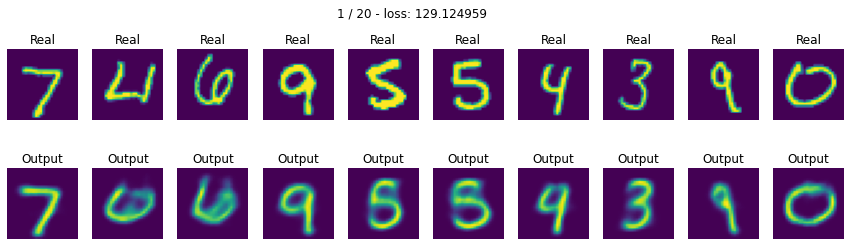

train iter::   0%|          | 0/1875 [00:00<?, ?it/s]

val iter::   0%|          | 0/313 [00:00<?, ?it/s]

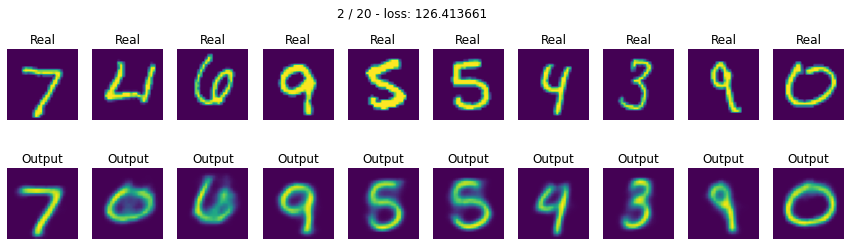

train iter::   0%|          | 0/1875 [00:00<?, ?it/s]

val iter::   0%|          | 0/313 [00:00<?, ?it/s]

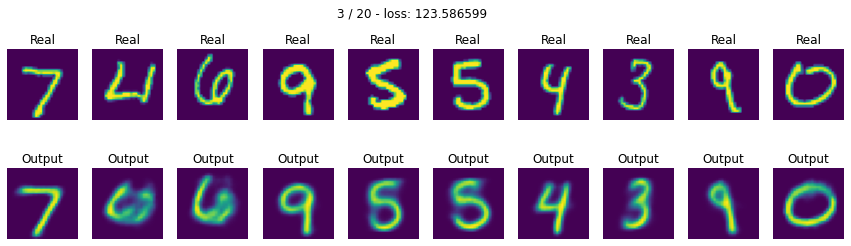

train iter::   0%|          | 0/1875 [00:00<?, ?it/s]

val iter::   0%|          | 0/313 [00:00<?, ?it/s]

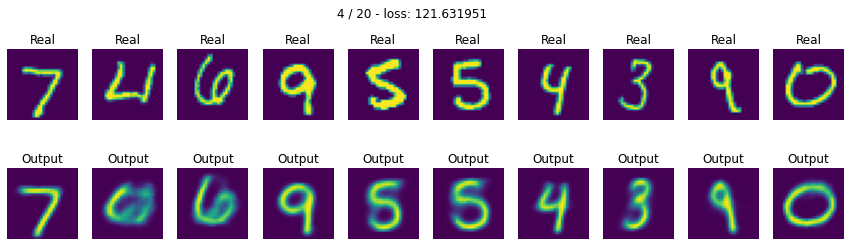

train iter::   0%|          | 0/1875 [00:00<?, ?it/s]

val iter::   0%|          | 0/313 [00:00<?, ?it/s]

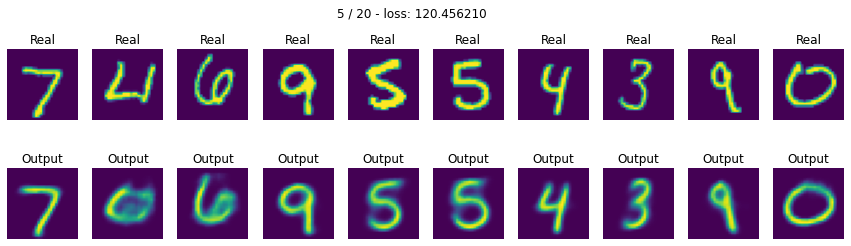

train iter::   0%|          | 0/1875 [00:00<?, ?it/s]

val iter::   0%|          | 0/313 [00:00<?, ?it/s]

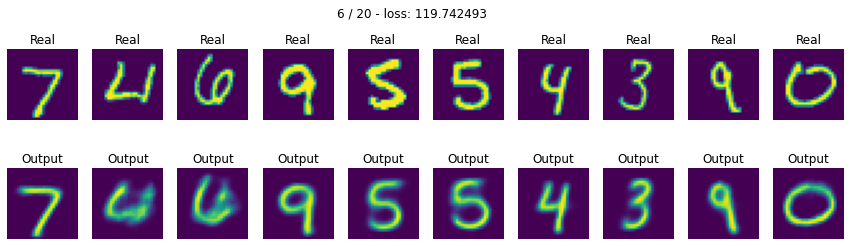

train iter::   0%|          | 0/1875 [00:00<?, ?it/s]

val iter::   0%|          | 0/313 [00:00<?, ?it/s]

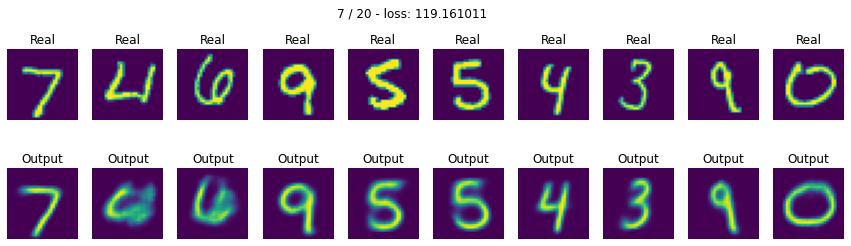

train iter::   0%|          | 0/1875 [00:00<?, ?it/s]

val iter::   0%|          | 0/313 [00:00<?, ?it/s]

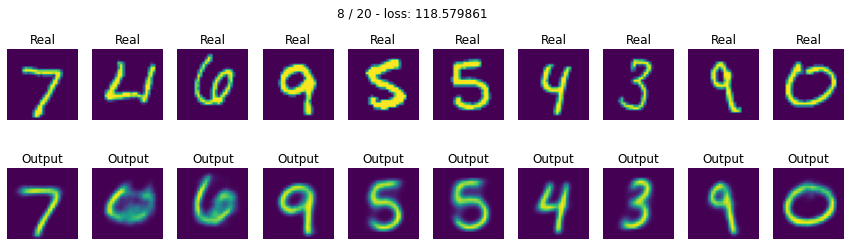

train iter::   0%|          | 0/1875 [00:00<?, ?it/s]

val iter::   0%|          | 0/313 [00:00<?, ?it/s]

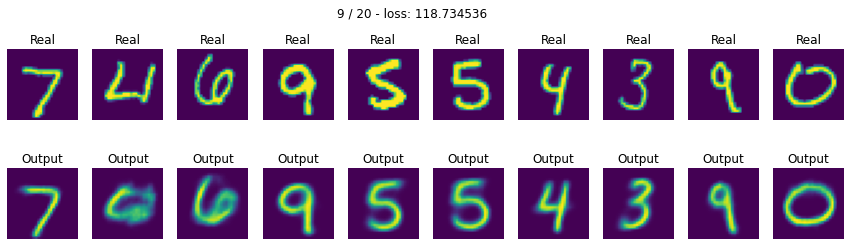

train iter::   0%|          | 0/1875 [00:00<?, ?it/s]

val iter::   0%|          | 0/313 [00:00<?, ?it/s]

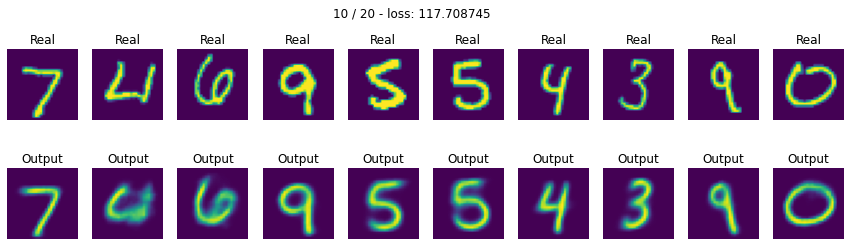

train iter::   0%|          | 0/1875 [00:00<?, ?it/s]

val iter::   0%|          | 0/313 [00:00<?, ?it/s]

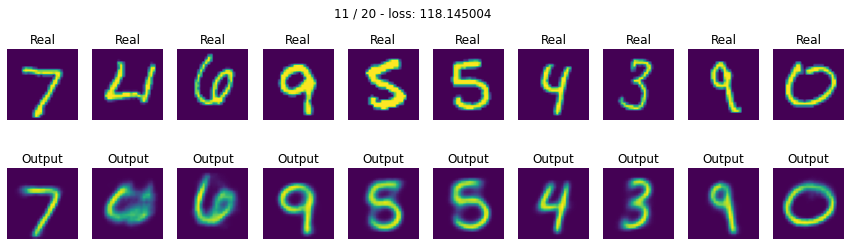

train iter::   0%|          | 0/1875 [00:00<?, ?it/s]

val iter::   0%|          | 0/313 [00:00<?, ?it/s]

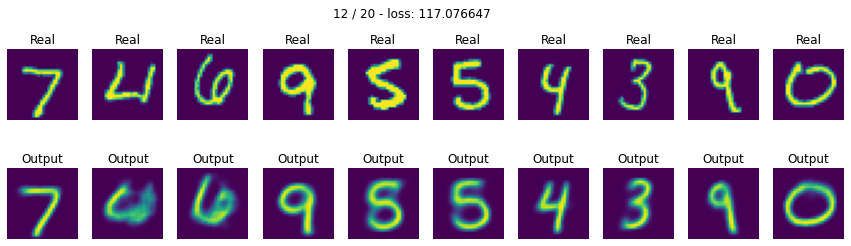

train iter::   0%|          | 0/1875 [00:00<?, ?it/s]

val iter::   0%|          | 0/313 [00:00<?, ?it/s]

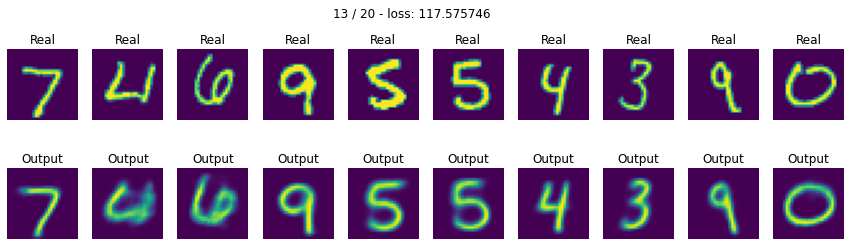

train iter::   0%|          | 0/1875 [00:00<?, ?it/s]

val iter::   0%|          | 0/313 [00:00<?, ?it/s]

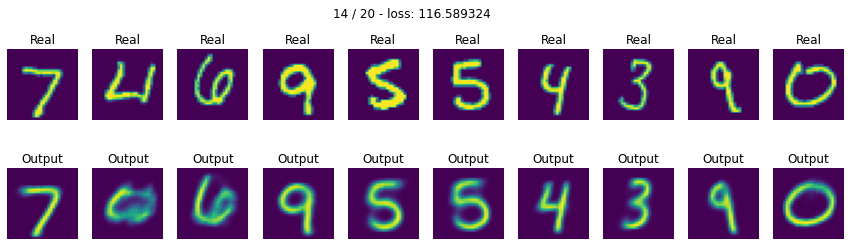

train iter::   0%|          | 0/1875 [00:00<?, ?it/s]

val iter::   0%|          | 0/313 [00:00<?, ?it/s]

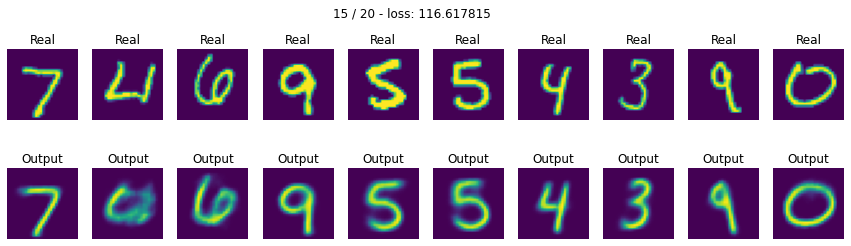

train iter::   0%|          | 0/1875 [00:00<?, ?it/s]

val iter::   0%|          | 0/313 [00:00<?, ?it/s]

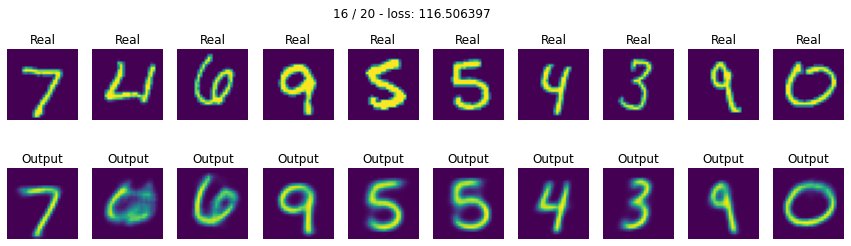

train iter::   0%|          | 0/1875 [00:00<?, ?it/s]

val iter::   0%|          | 0/313 [00:00<?, ?it/s]

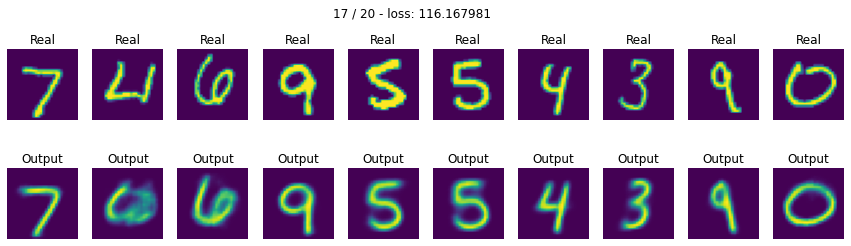

train iter::   0%|          | 0/1875 [00:00<?, ?it/s]

val iter::   0%|          | 0/313 [00:00<?, ?it/s]

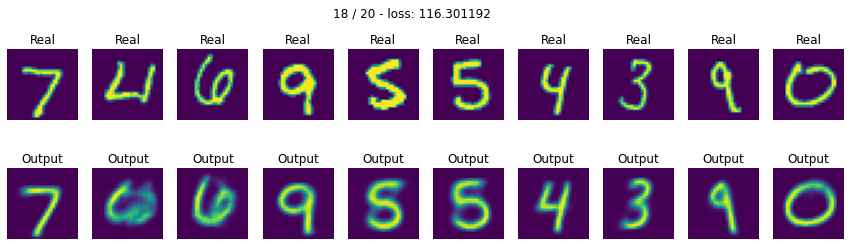

train iter::   0%|          | 0/1875 [00:00<?, ?it/s]

val iter::   0%|          | 0/313 [00:00<?, ?it/s]

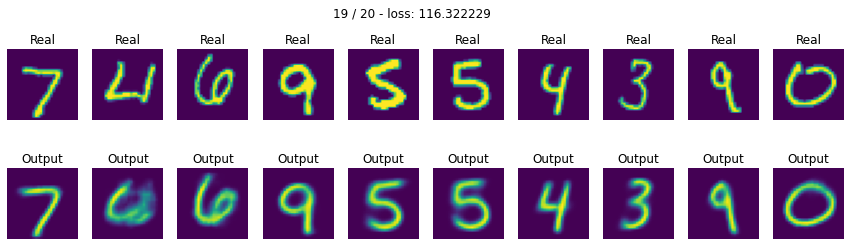

train iter::   0%|          | 0/1875 [00:00<?, ?it/s]

val iter::   0%|          | 0/313 [00:00<?, ?it/s]

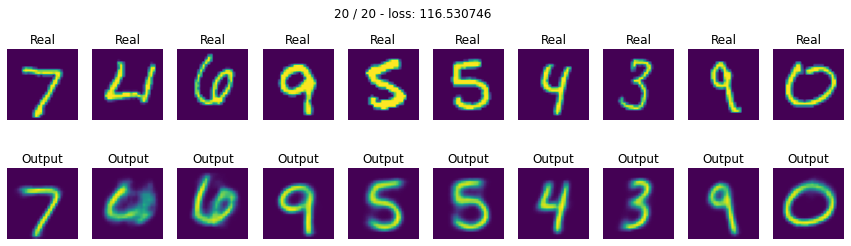

Training complete in 83m 3s


In [ ]:
conv_VAE, losses = train_model(conv_VAE, train_loader, test_loader, criterion, optimizer, n_epochs=20)
save_model_params(conv_VAE, 'conv_VAE_02')

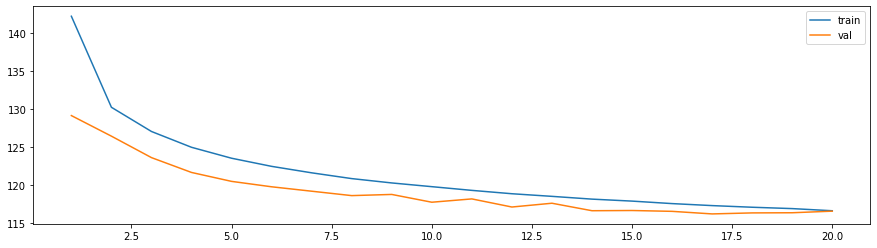

In [ ]:
x_range = range(1,len(losses['train'])+1)
plt.plot(x_range, losses['train'], label='train')
plt.plot(x_range, losses['val'], label='val')
plt.legend()
plt.show()

Давайте посмотрим, как наш тренированный VAE кодирует и восстанавливает картинки:

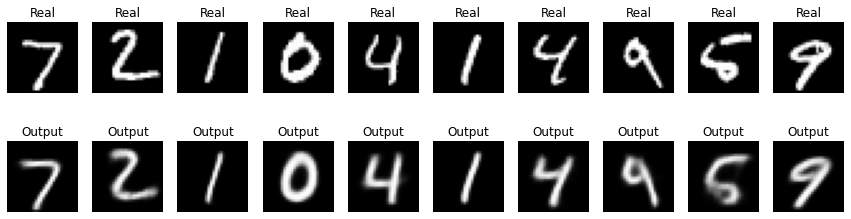

In [ ]:
# < тут Ваш код: выведите первые Х картинок и их реконструкций из val выборки на экран>

conv_VAE.eval()
with torch.no_grad():
    for X_batch, _ in test_loader:
        X_batch = X_batch.to(DEVICE).float()

        reconstruction, _, _ = conv_VAE(X_batch)

        n = 10
        for k in range(n):
            plt.subplot(2, n, k+1)
            plt.imshow(X_batch[k].squeeze(0).detach().cpu().numpy(), cmap='gray')
            plt.title('Real')
            plt.axis('off')

            plt.subplot(2, n, k+n+1)
            plt.imshow(reconstruction[k].squeeze(0).detach().cpu().numpy(), cmap='gray')
            plt.title('Output')
            plt.axis('off')
        plt.show()

        break

Давайте попробуем проделать для VAE то же, что и с обычным автоэнкодером -- подсунуть decoder'у из VAE случайные векторы из нормального распределения и посмотреть, какие картинки получаются:

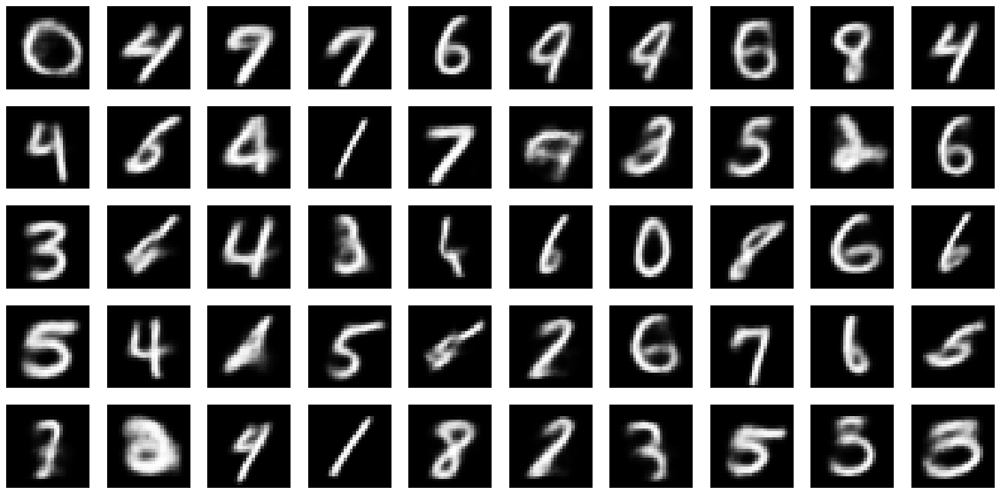

In [ ]:
# вспомните про замечание из этого же пункта обычного AE про распределение латентных переменных
dim_code = 4
z = np.array([np.random.normal(0, 1, dim_code) for i in range(50)])
z = torch.tensor(z).to(DEVICE).float()
output = conv_VAE.decode(z)# <скормите z декодеру>
# <выведите тут полученные картинки>

plt.figure(figsize=(20,10))
n_col = 10
n_row = 5
for k in range(50):
    plt.subplot(n_row, n_col, k+1)
    plt.imshow(output[k].squeeze(0).detach().cpu().numpy(), cmap='gray')
    plt.axis('off')
plt.show()

так как в лосс для VAE включен KL-divergence, то латентное пространство имеет mean=0,  std=1, никакие поправки не нужны, в отличие от автоэнкодера для лиц

## 2.2. Latent Representation (2 балла)

Давайте посмотрим, как латентные векторы картинок лиц выглядят в пространстве.
Ваша задача -- изобразить латентные векторы картинок точками в двумерном просторанстве. 

Это позволит оценить, насколько плотно распределены латентные векторы изображений цифр в пространстве. 

Плюс давайте сделаем такую вещь: покрасим точки, которые соответствуют картинкам каждой цифры, в свой отдельный цвет

Подсказка: красить -- это просто =) У plt.scatter есть параметр c (color), см. в документации.


Итак, план:
1. Получить латентные представления картинок тестового датасета
2. С помощтю `TSNE` (есть в `sklearn`) сжать эти представления до размерности 2 (чтобы можно было их визуализировать точками в пространстве)
3. Визуализировать полученные двумерные представления с помощью `matplotlib.scatter`, покрасить разными цветами точки, соответствующие картинкам разных цифр.

In [ ]:
mu_all = []
logsigma_all = []

conv_VAE.eval()
with torch.no_grad():
    for X_batch, _ in test_loader:
        X_bacth = X_batch.to(DEVICE).float()
        mu, logsigma = conv_VAE.encode(X_batch) # B x dim_code 
        mu_all.append(mu)
        logsigma_all.append(logsigma)

mu_all = torch.cat(mu_all)
logsigma_all = torch.cat(logsigma_all)
labels = test_loader.dataset.targets
# mu_all to numpy
# y to numpy

In [ ]:
print(f'mean: {torch.mean(mu_all, dim=0)}')
print(f'std of mean: {torch.std(mu_all, dim=0)}', end='\n\n')
print(f'logsigma: {torch.mean(logsigma_all, dim=0)}')
print(f'std of logsigma: {torch.std(logsigma_all, dim=0)}', end='\n\n')
print(f'sigma: {torch.mean(torch.exp(logsigma_all), dim=0)}')
print(f'std of sigma: {torch.std(torch.exp(logsigma_all), dim=0)}')

mean: tensor([0.0560, 0.0138, 0.0894, 0.0265])
std of mean: tensor([1.0422, 1.0305, 1.0389, 1.0612])

logsigma: tensor([-5.4692, -5.1250, -5.1843, -5.4588])
std of logsigma: tensor([0.5430, 0.6212, 0.5670, 0.6640])

sigma: tensor([0.0051, 0.0074, 0.0068, 0.0055])
std of sigma: tensor([0.0049, 0.0064, 0.0063, 0.0054])


In [ ]:
from sklearn.manifold import TSNE

mu_embedded = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(mu_all)

In [ ]:
import pandas as pd

mu_visual = pd.DataFrame(data=mu_embedded, columns=['x', 'y'])
mu_visual['label'] = labels
print(mu_visual.shape)
mu_visual.head()

(10000, 3)


,x,y,label
0,56.682068,32.186295,7
1,-82.232567,-35.886902,2
2,71.996056,-39.199551,1
3,-8.720823,-56.567940,0
4,-19.436399,69.072685,4


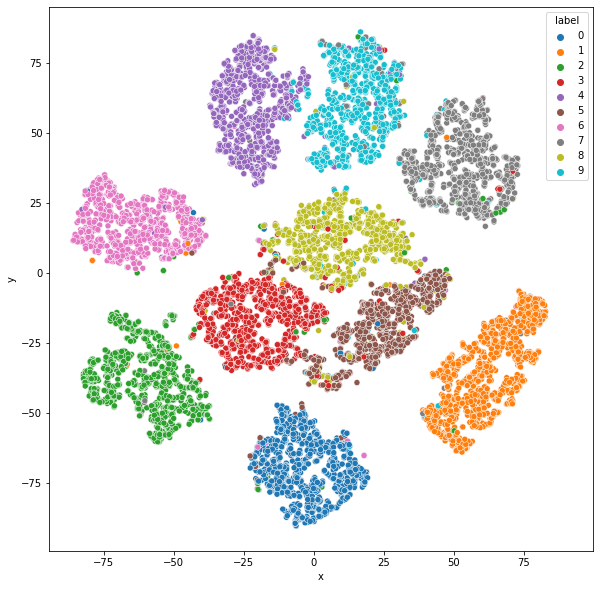

In [ ]:
import seaborn as sns

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = 'x', 
    y = 'y',
    hue = 'label',
    palette = sns.color_palette('tab10', 10),
    data = mu_visual,
    legend = 'full',
    );
plt.axis('square');

Что вы думаете о виде латентного представления?

Масштаб по обеим осям одинаковый, центр примерно в нуле и общая форма круглая.

В целом, все 10 кластеров хорошо разделимы.

__Congrats v2.0!__

## 2.3. Conditional VAE (6 баллов)


Мы уже научились обучать обычный AE на датасете картинок и получать новые картинки, используя генерацию шума и декодер. 
Давайте теперь допустим, что мы обучили AE на датасете MNIST и теперь хотим генерировать новые картинки с числами с помощью декодера (как выше мы генерили рандомные лица). 
И вот нам понадобилось сгенерировать цифру 8, и мы подставляем разные варианты шума, но восьмерка никак не генерится:(

Хотелось бы добавить к нашему AE функцию "выдай мне рандомное число из вот этого вот класса", где классов десять (цифры от 0 до 9 образуют десять классов).  Conditional AE — так называется вид автоэнкодера, который предоставляет такую возможность. Ну, название "conditional" уже говорит само за себя.

И в этой части задания мы научимся такие обучать.

### Архитектура

На картинке ниже представлена архитектура простого Conditional VAE.

По сути, единственное отличие от обычного -- это то, что мы вместе с картинкой в первом слое энкодера и декодера передаем еще информацию о классе картинки. 

То есть, в первый (входной) слой энкодера подается конкатенация картинки и информации о классе (например, вектора из девяти нулей и одной единицы). В первый слой декодера подается конкатенация латентного вектора и информации о классе.


![alt text](https://sun9-63.userapi.com/impg/Mh1akf7mfpNoprrSWsPOouazSmTPMazYYF49Tw/djoHNw_9KVA.jpg?size=1175x642&quality=96&sign=e88baec5f9bb91c8443fba31dcf0a4df&type=album)

![alt text](https://sun9-73.userapi.com/impg/UDuloLNKhzTBYAKewgxke5-YPsAKyGOqA-qCRg/MnyCavJidxM.jpg?size=1229x651&quality=96&sign=f2d21bfacc1c5755b76868dc4cfef39c&type=album)



На всякий случай: это VAE, то есть, latent у него все еще состоит из mu и sigma

Таким образом, при генерации новой рандомной картинки мы должны будем передать декодеру сконкатенированные латентный вектор и класс картинки.

P.S. Также можно передавать класс картинки не только в первый слой, но и в каждый слой сети. То есть на каждом слое конкатенировать выход из предыдущего слоя и информацию о классе.

In [ ]:
def one_hot(x):
    return torch.eye(10)[x]

In [ ]:
class ConvCVAE(nn.Module):
    def __init__(self, dim_code: int = 4, img_size: int = 28, class_num: int = 10, inference: bool = True):
        # <определите архитектуры encoder и decoder
        # помните, у encoder должны быть два "хвоста", 
        # т.е. encoder должен кодировать картинку в 2 переменные -- mu и logsigma>

        super().__init__()

        self.img_size = img_size
        self.class_num = class_num
        self.dim_code = dim_code
        self.inference = inference

        self.embedded_class = nn.Linear(self.class_num, self.img_size*self.img_size)

        # encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels=1+1, out_channels=32, kernel_size=3, stride=2, padding=1), # B x 32 x 14 x 14
            nn.BatchNorm2d(32),
            nn.LeakyReLU(),
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=2, padding=1), # B x 64 x 7 x 7
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=2, padding=1), # B x 128 x 4 x 4
            nn.BatchNorm2d(128),
            nn.LeakyReLU(),
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=2, padding=1), # B x 256 x 2 x 2
            nn.BatchNorm2d(256),
            nn.LeakyReLU()
        )

        self.fc_mu = nn.Linear(256*2*2, self.dim_code)
        self.fc_logsigma = nn.Linear(256*2*2, self.dim_code)

        self.decoder_input = nn.Linear(self.dim_code + self.class_num, 256*2*2)

        # decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=3, stride=2, padding=1, output_padding=1), # B x 128 x 4 x 4
            nn.BatchNorm2d(128),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=3, stride=2, padding=1, output_padding=0), # B x 64 x 7 x 7
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(in_channels=64, out_channels=32, kernel_size=3, stride=2, padding=1, output_padding=1), # B x 32 x 14 x 14
            nn.BatchNorm2d(32),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(in_channels=32, out_channels=32, kernel_size=3, stride=2, padding=1, output_padding=1), # B x 32 x 28 x 28
            nn.BatchNorm2d(32),
            nn.LeakyReLU(),
            nn.Conv2d(in_channels=32, out_channels=1, kernel_size=3, padding=1) # B x 1 x 28 x 28
        )

    def encode(self, x, y):
        # <реализуйте forward проход энкодера
        # в качестве ваозвращаемых переменных -- mu, logsigma и класс картинки>

        y = self.embedded_class(y) # B x 28*28
        y = y.view(-1, 1, self.img_size, self.img_size) # B x 1 x 28 x 28
        x = torch.cat([x, y], dim=1) # in classes b x 2 x 28 x 28
        x = self.encoder(x) # B x 256 x 2 x 2
        x = x.view(-1, 256*2*2)
        
        mu = self.fc_mu(x) # B x dim_code
        logsigma = self.fc_logsigma(x) # B x dim_code
        return mu, logsigma
    
    def gaussian_sampler(self, mu, logsigma):
        if self.inference:
            if self.training:
                # <засемплируйте латентный вектор из нормального распределения с параметрами mu и sigma>

                # Reparameterization trick to sample from N(mu, var) from N(0,1)
                std = torch.exp(0.5 * logsigma)
                eps = torch.randn_like(std) #  sample from N(0,1)
                sample = mu + (eps * std)
                return sample
            else:
                # на инференсе возвращаем не случайный вектор из нормального распределения, а центральный -- mu. 
                # на инференсе выход автоэнкодера должен быть детерминирован.
                return mu
        else:
            std = torch.exp(0.5 * logsigma)
            eps = torch.randn_like(std) #  sample from N(0,1)
            sample = mu + (eps * std)
            return sample
    
    def decode(self, z, y):
        # <реализуйте forward проход декодера
        # в качестве возвращаемой переменной -- reconstruction>
        # B x dim_code

        z = torch.cat([z, y], dim=1) # B x 4+10
        z = self.decoder_input(z) # B x 256*2*2
        z = z.view(-1, 256, 2, 2) # B x 256 x 2 x 2 
        reconstruction = self.decoder(z) # B x 1 x 28 x 28
        reconstruction = torch.tanh(reconstruction)
        
        return reconstruction

    def forward(self, x, y):
        # <используя encode и decode, реализуйте forward проход автоэнкодера
        # в качестве ваозвращаемых переменных -- mu, logsigma и reconstruction>
        # B x C x W x H

        mu, logsigma = self.encode(x, y)
        z = self.gaussian_sampler(mu, logsigma)
        reconstruction = self.decode(z, y)

        return reconstruction, mu, logsigma

In [ ]:
def KL_divergence(mu, logsigma):
    """
    часть функции потерь, которая отвечает за "близость" латентных представлений разных людей
    """
    # <напишите код для KL-дивергенции, пользуясь формулой выше>
    return -0.5 * torch.sum(1 + logsigma - mu.pow(2) - logsigma.exp())

# def log_likelihood(x, reconstruction):
#     """
#     часть функции потерь, которая отвечает за качество реконструкции (как mse в обычном autoencoder)
#     """
#     return nn.BCELoss()(reconstruction, x) # <binary cross-entropy>

def loss_vae(x, mu, logsigma, reconstruction):
    # <соедините тут две компоненты лосса. Mind the sign!>
    return KL_divergence(mu, logsigma) + nn.MSELoss()(x, reconstruction)

In [ ]:
# <тут Ваш код тренировки автоэнкодера>
from tqdm.autonotebook import tqdm, trange
from time import time

def train_model(model, train_loader, val_loader, loss_func, optimizer, n_epochs=30):
    losses = {'train': [], 'val': []}

    tic = time()
    pbar = trange(n_epochs, desc='Epoch:')

    for epoch in pbar:
        running_loss = 0

        model.train()
        for X_batch, y_batch in tqdm(train_loader, leave=False, desc=f"train iter:"):
            X_batch = X_batch.to(DEVICE).float()
            y_batch = one_hot(y_batch).to(DEVICE)

            optimizer.zero_grad()
            reconstruction, mu, logsigma = model(X_batch, y_batch)
            loss = loss_func(X_batch, mu, logsigma, reconstruction)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

        epoch_loss = running_loss / len(train_loader.dataset)
        losses['train'].append(epoch_loss)
        pbar.set_description('train Loss: {:.4f}'.format(epoch_loss))
        running_loss = 0

        n_visuals = 10
        visual = [0] * n_visuals
        i = 0

        model.eval()
        with torch.no_grad():
            for X_batch, y_batch in tqdm(val_loader, leave=False, desc=f"val iter:"):
                X_batch = X_batch.to(DEVICE).float()
                y_batch = one_hot(y_batch).to(DEVICE)

                reconstruction, mu, logsigma = model(X_batch, y_batch)
                loss = loss_func(X_batch, mu, logsigma, reconstruction)
                running_loss += loss.item()

                if i < 10:
                  visual[i] = (X_batch[i], reconstruction[i])
                  i += 1

        
        epoch_loss = running_loss / len(val_loader.dataset)
        losses['val'].append(epoch_loss)
        pbar.set_description('val Loss: {:.4f}'.format(epoch_loss))

        # Visualize tools
        #clear_output(wait=True)
        for k in range(n_visuals):
            plt.subplot(2, n_visuals, k+1)
            plt.imshow(visual[k][0].squeeze(0).detach().cpu().numpy())
            plt.title('Real')
            plt.axis('off')

            plt.subplot(2, n_visuals, k+n_visuals+1)
            plt.imshow(visual[k][1].squeeze(0).detach().cpu().numpy())
            plt.title('Output')
            plt.axis('off')
        plt.suptitle('%d / %d - loss: %f' % (epoch+1, n_epochs, epoch_loss))
        plt.show()


    toc = time()
    time_elapsed = toc - tic
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))

    return model, losses
  

In [ ]:
conv_CVAE = ConvCVAE().to(DEVICE)

criterion = loss_vae
optimizer = torch.optim.Adam(conv_CVAE.parameters(), lr=0.0001)

Epoch::   0%|          | 0/30 [00:00<?, ?it/s]

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

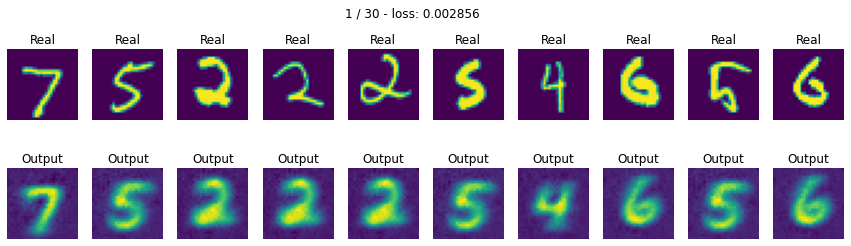

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

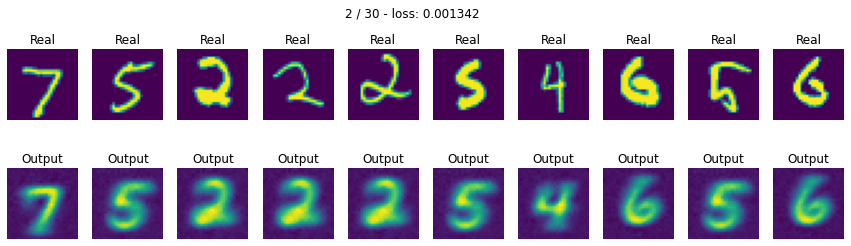

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

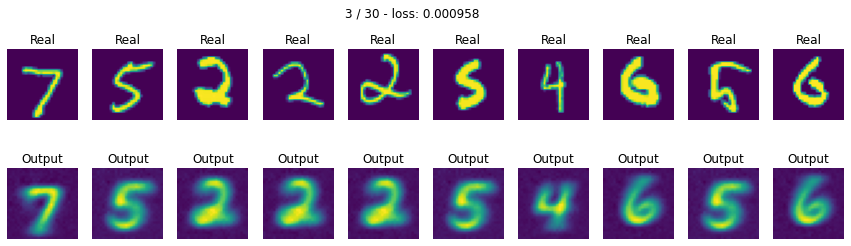

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

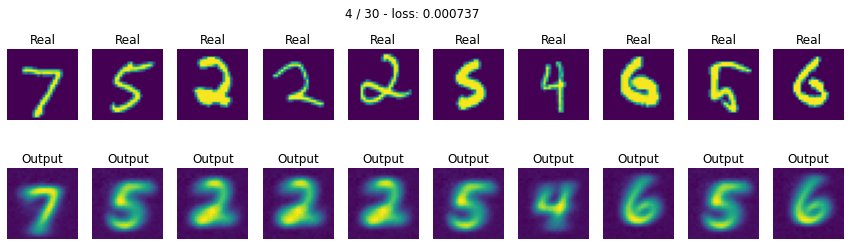

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

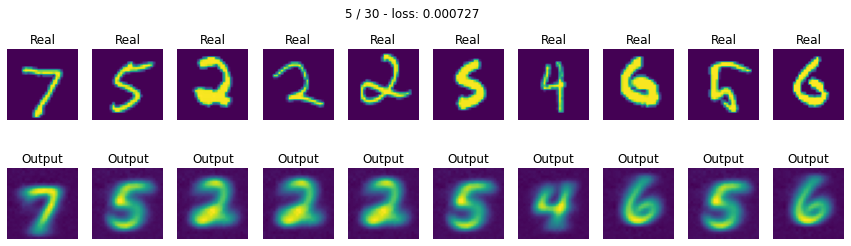

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

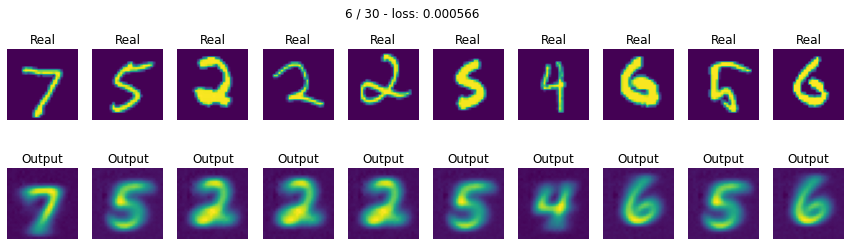

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

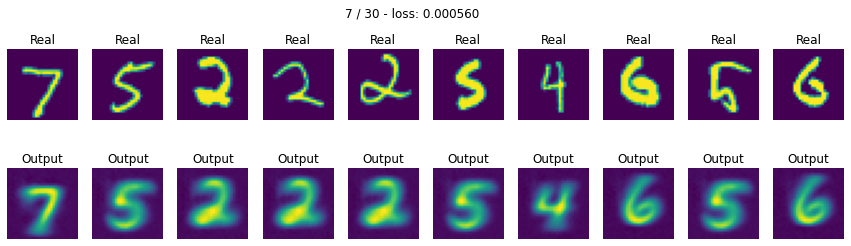

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

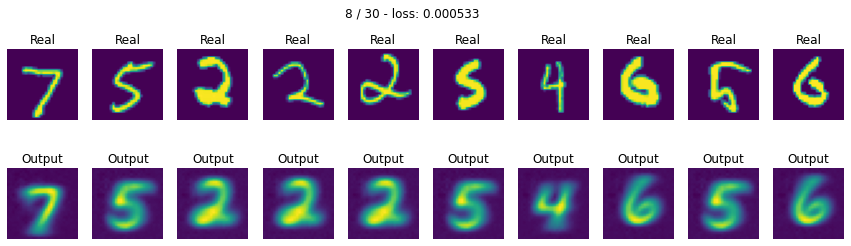

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

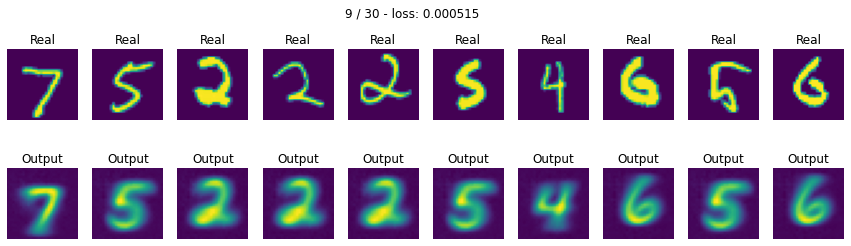

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

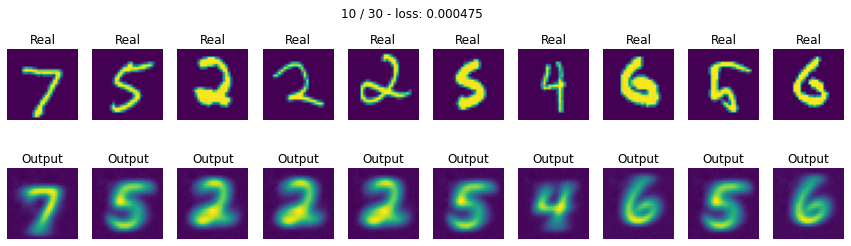

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

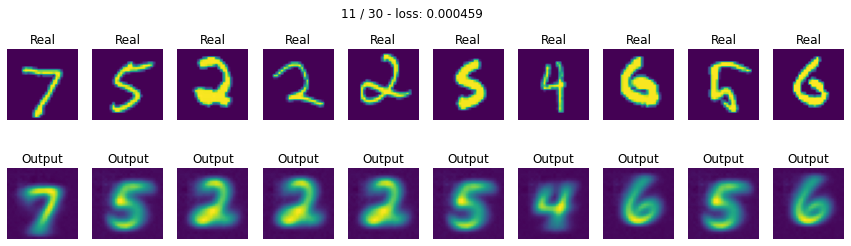

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

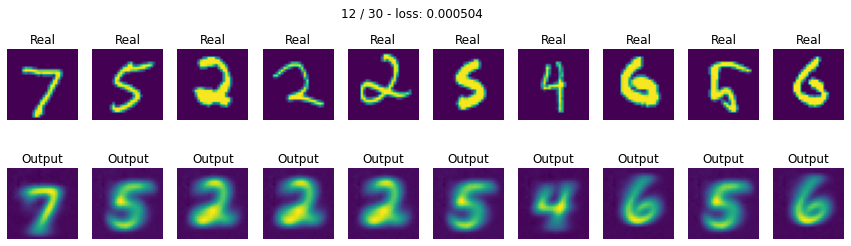

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

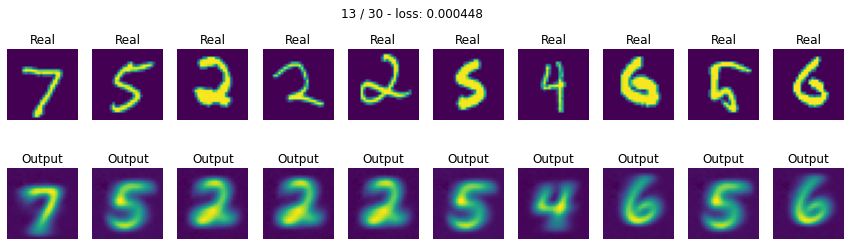

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

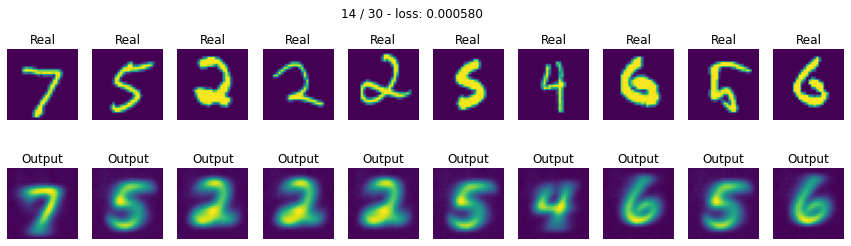

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

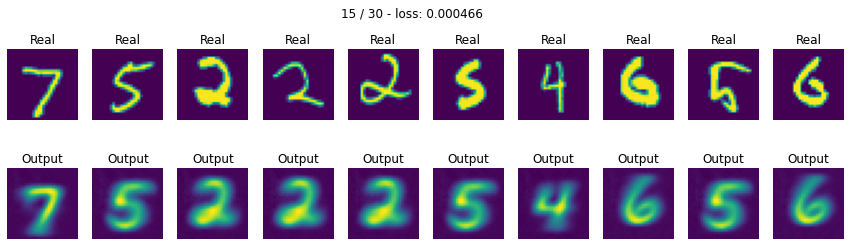

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

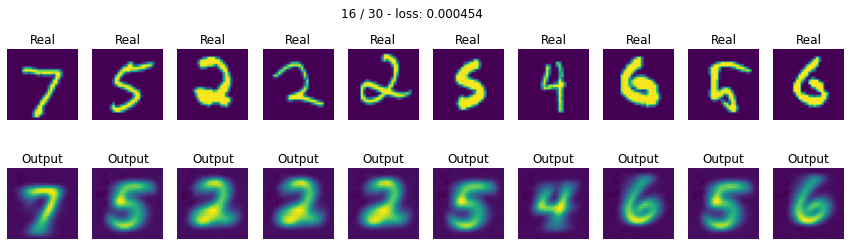

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

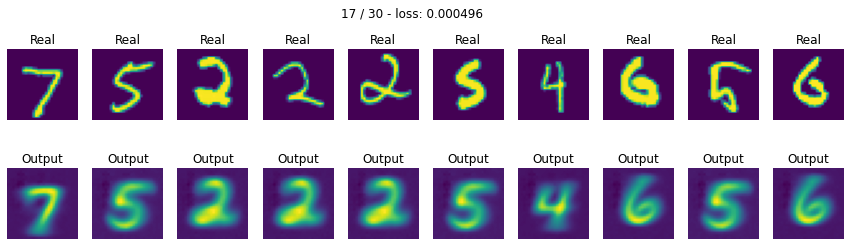

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

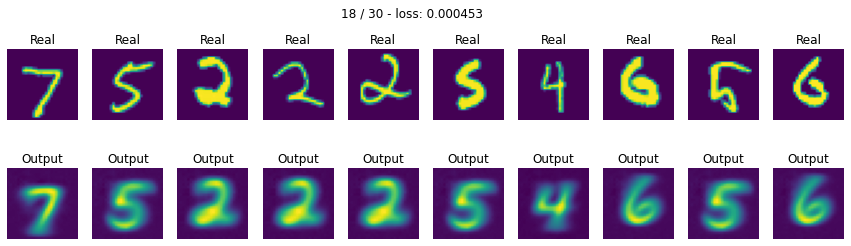

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

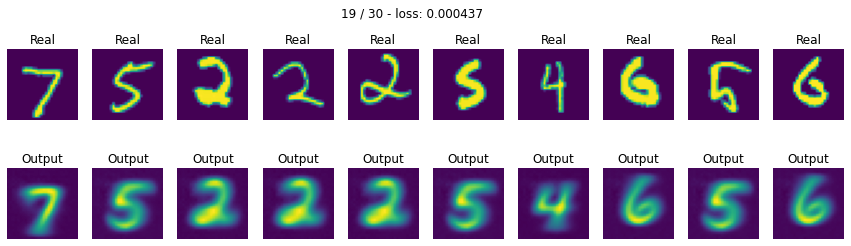

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

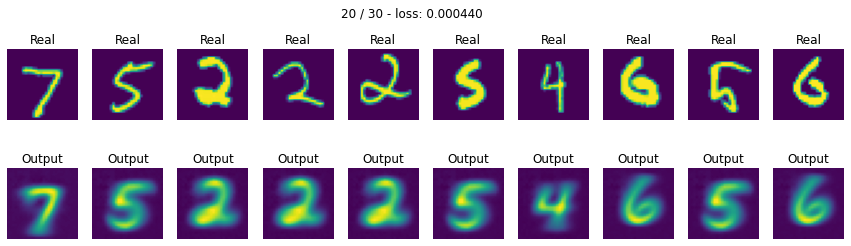

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

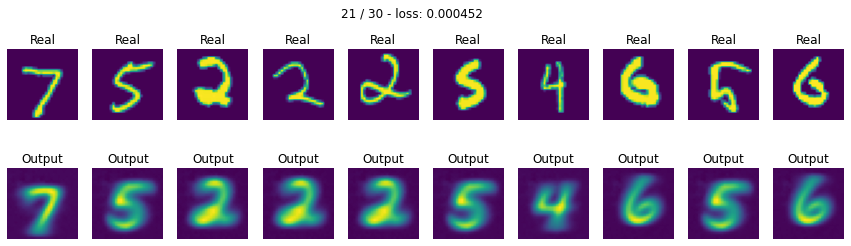

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

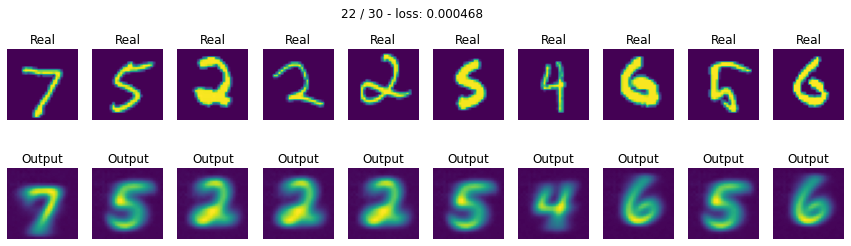

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

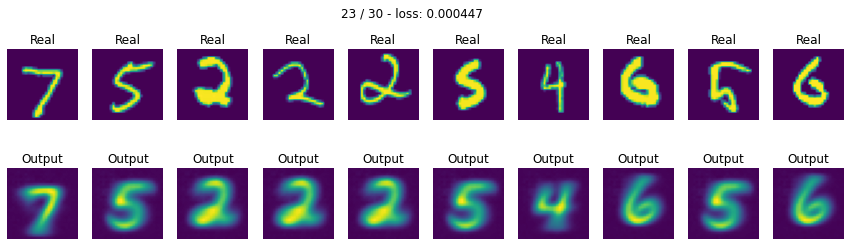

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

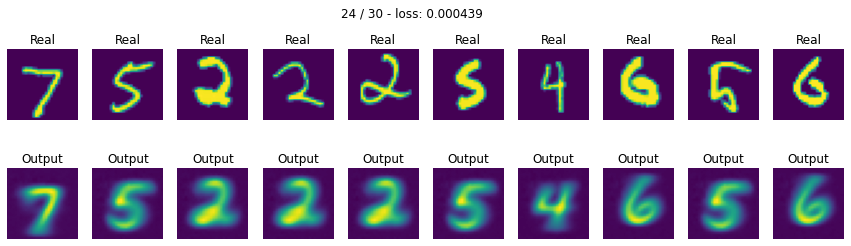

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

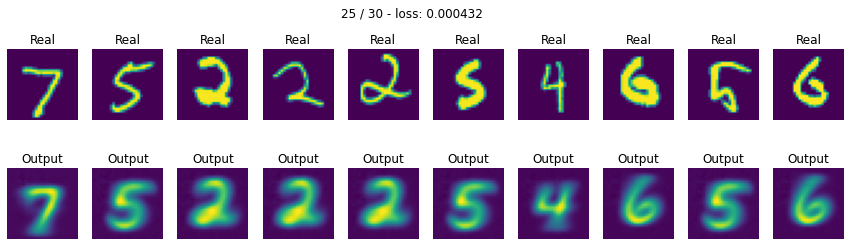

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

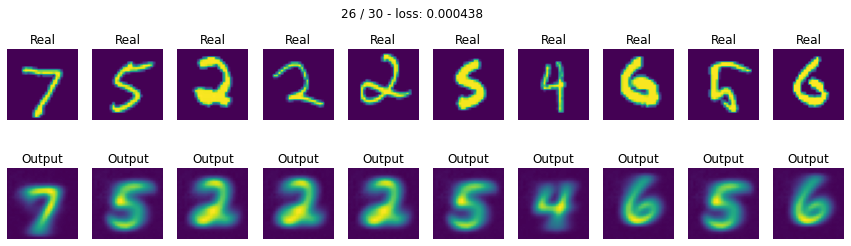

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

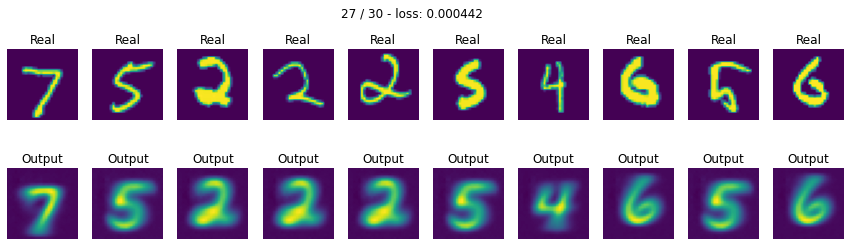

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

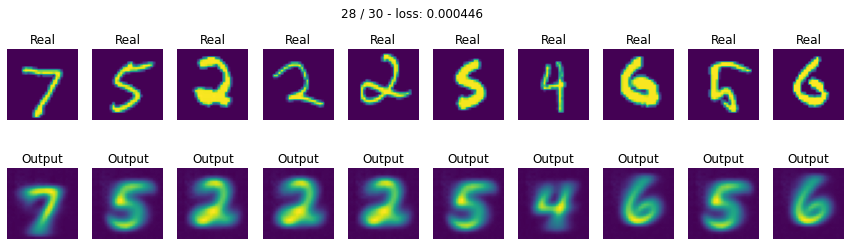

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

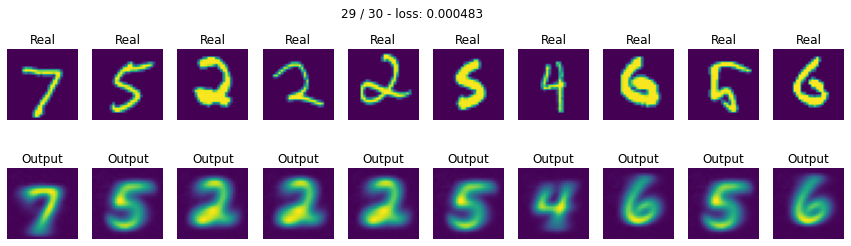

train iter::   0%|          | 0/469 [00:00<?, ?it/s]

val iter::   0%|          | 0/79 [00:00<?, ?it/s]

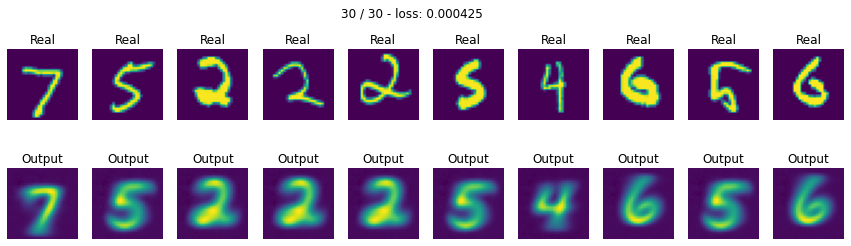

Training complete in 7m 36s


In [ ]:
conv_CVAE, losses = train_model(conv_CVAE, train_loader, test_loader, criterion, optimizer, n_epochs=30)
save_model_params(conv_CVAE, 'conv_CVAE_02_128')

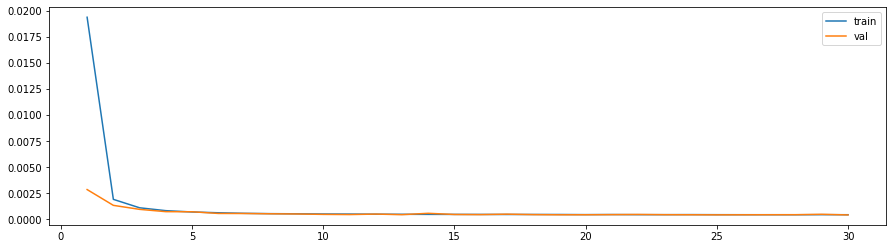

In [ ]:
x_range = range(1,len(losses['train'])+1)
plt.plot(x_range, losses['train'], label='train')
plt.plot(x_range, losses['val'], label='val')
plt.legend()
plt.show()

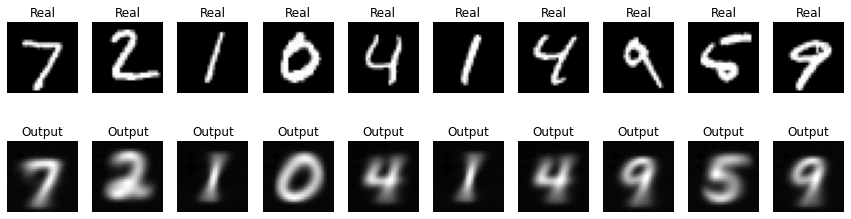

In [ ]:
# < тут Ваш код: выведите первые Х картинок и их реконструкций из val выборки на экран>

conv_CVAE.eval()
with torch.no_grad():
    for X_batch, y_batch in test_loader:
        X_batch = X_batch.to(DEVICE).float()
        y_batch = one_hot(y_batch).to(DEVICE)

        reconstruction, _, _ = conv_CVAE(X_batch, y_batch)

        n = 10
        for k in range(n):
            plt.subplot(2, n, k+1)
            plt.imshow(X_batch[k].squeeze(0).detach().cpu().numpy(), cmap='gray')
            plt.title('Real')
            plt.axis('off')

            plt.subplot(2, n, k+n+1)
            plt.imshow(reconstruction[k].squeeze(0).detach().cpu().numpy(), cmap='gray')
            plt.title('Output')
            plt.axis('off')
        plt.show()

        break

### Sampling


Тут мы будем сэмплировать из CVAE. Это прикольнее, чем сэмплировать из простого AE/VAE: тут можно взять один и тот же латентный вектор и попросить CVAE восстановить из него картинки разных классов!
Для MNIST вы можете попросить CVAE восстановить из одного латентного вектора, например, картинки цифры 5 и 7.

In [ ]:
conv_CVAE = ConvCVAE().to(DEVICE)

load_model(conv_CVAE, 'conv_CVAE_02_128')

In [ ]:
# <тут нужно научиться сэмплировать из декодера цифры определенного класса>

Latent space vector:  tensor([[ 0.8585, -0.6406,  0.1846,  0.7498]])


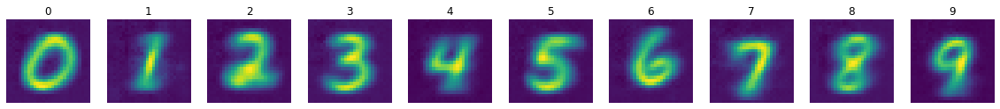

Latent space vector:  tensor([[ 0.5766,  0.5991,  0.5739, -1.0487]])


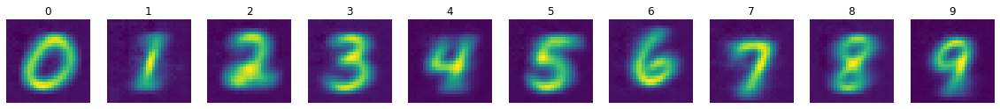

Latent space vector:  tensor([[ 0.0176, -0.9092, -0.2895, -1.1688]])


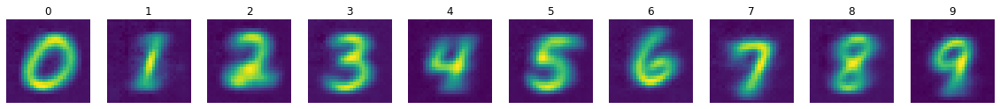

Latent space vector:  tensor([[ 0.3450, -1.9652,  0.6173,  0.0153]])


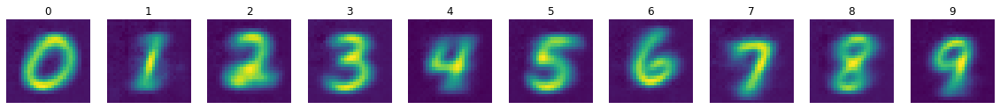

Latent space vector:  tensor([[ 1.9022, -0.2046, -0.2049,  0.6825]])


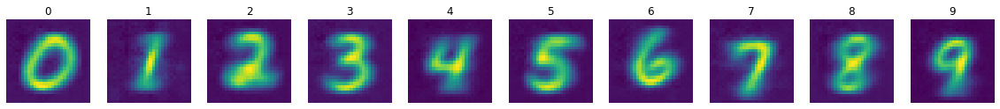

In [ ]:
dim_code = 4
for n in range(5):
    z = np.random.normal(0, 1, dim_code, )
    z = torch.tensor(z).unsqueeze(0).to(DEVICE).float()
    print(f'Latent space vector: ',  z)

    plt.figure(figsize=(20,10))
    for i in range(10):
        cl = one_hot(i).unsqueeze(0)
        output = conv_CVAE.decode(z, cl)#
        plt.subplot(1, 10, i+1)
        plt.imshow(output[0].squeeze(0).detach().cpu())
        plt.title(f'{i}')
        plt.axis('off')
    plt.show()

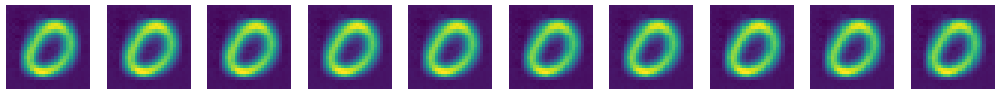

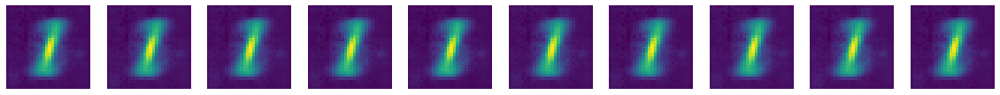

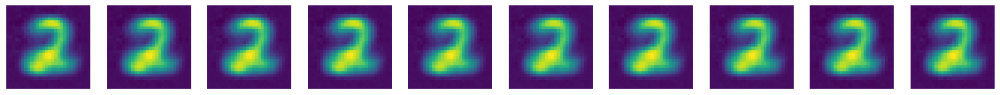

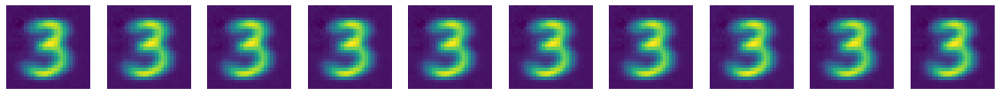

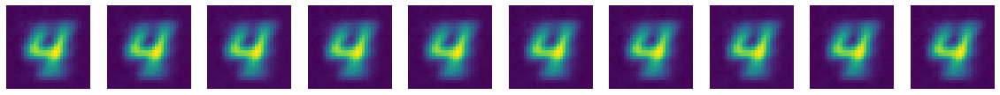

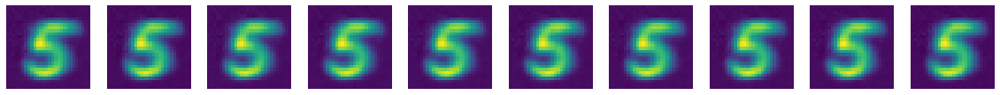

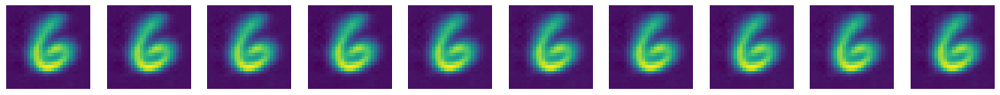

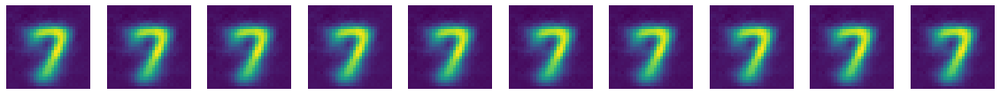

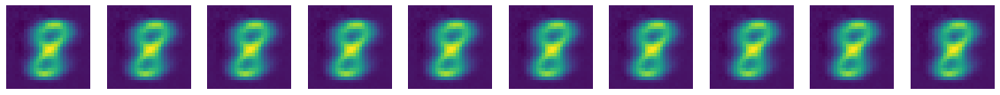

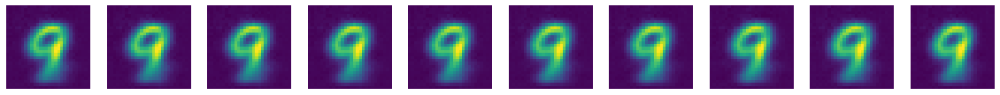

In [ ]:
dim_code = 4
for n in range(10):
    plt.figure(figsize=(20,10))
    for i in range(10):
        z = np.random.normal(0, 1, dim_code)
        z = torch.tensor(z).unsqueeze(0).to(DEVICE).float()
        cl = one_hot(n).unsqueeze(0)
        output = conv_CVAE.decode(z, cl)# <скормите z декодеру>
        plt.subplot(1, 10, i+1)
        plt.imshow(output[0].squeeze(0).detach().cpu())
        plt.axis('off')
    plt.show()

для разных латентных представлений вид цифр почти не изменяется, что странно

Splendid! Вы великолепны!


### Latent Representations

Давайте посмотрим, как выглядит латентное пространство картинок в CVAE и сравним с картинкой для VAE =)

Опять же, нужно покрасить точки в разные цвета в зависимости от класса.

In [ ]:
# <ваш код получения латентных представлений, применения TSNE и визуализации>

In [ ]:
mu_all = []

conv_CVAE.eval()
with torch.no_grad():
    for X_batch, y_batch in test_loader:
        X_bacth = X_batch.to(DEVICE).float()
        y_batch = one_hot(y_batch).to(DEVICE)

        mu, _ = conv_CVAE.encode(X_batch, y_batch) # B x dim_code 
        mu_all.append(mu)

mu_all = torch.cat(mu_all)
labels = test_loader.dataset.targets
# mu_all to numpy
# y to numpy

In [ ]:
from sklearn.manifold import TSNE

mu_embedded = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(mu_all)

In [ ]:
import pandas as pd

mu_visual = pd.DataFrame(data=mu_embedded, columns=['x', 'y'])
mu_visual['label'] = labels
print(mu_visual.shape)
mu_visual.head()

(10000, 3)


,x,y,label
0,47.231361,-59.893257,7
1,-12.916202,43.246742,2
2,85.835983,-14.889990,1
3,-44.959625,20.236031,0
4,-32.007202,38.708466,4


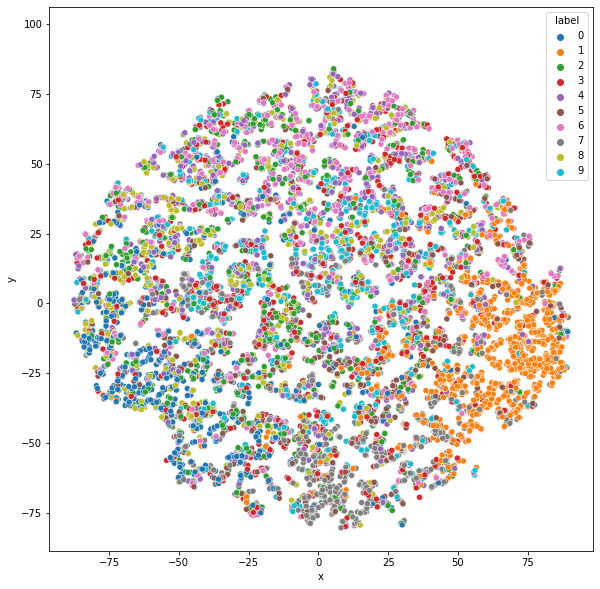

In [ ]:
import seaborn as sns

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = 'x', 
    y = 'y',
    hue = 'label',
    palette = sns.color_palette('tab10', 10),
    data = mu_visual,
    legend = 'full',
    );
plt.axis('square');

Что вы думаете насчет этой картинки? Отличается от картинки для VAE?

Для CVAE классы не разделяются в латентном пространстве, в отличие от VAE. (возможно потому, что так как информация о классе получается из вне, то просто не нужно выучивать информацию о классе)

# BONUS 1: Denoising

## Внимание! За бонусы доп. баллы не ставятся, но вы можете сделать их для себя.

У автоэнкодеров, кроме сжатия и генерации изображений, есть другие практические применения. Про одно из них эта бонусная часть задания.

Автоэнкодеры могут быть использованы для избавления от шума на фотографиях (denoising). Для этого их нужно обучить специальным образом: input картинка будет зашумленной, а выдавать автоэнкодер должен будет картинку без шума. 
То есть, loss-функция AE останется той же (MSE между реальной картинкой и выданной), а на вход автоэнкодеру будет подаваться зашумленная картинка.

<a href="https://ibb.co/YbRJ1nZ"><img src="https://i.ibb.co/0QD164t/Screen-Shot-2020-06-04-at-4-49-50-PM.png" alt="Screen-Shot-2020-06-04-at-4-49-50-PM" border="0"></a>

Для этого нужно взять ваш любимый датасет (датасет лиц из первой части этого задания или любой другой) и сделать копию этого датасета с шумом. 

В питоне шум можно добавить так:

In [ ]:
noise_factor = 0.5
X_noisy = X + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X.shape) 

In [ ]:
# <тут ваш код обучения автоэнкодера на зашумленных картинках. Не забудтье разбить на train/test!>

In [ ]:
# <тут проверка, как AE убирает щум с тестовых картинок. Надеюсь, все получилось =)>

# BONUS 2: Image Retrieval

## Внимание! За бонусы доп. баллы не ставятся, но вы можете сделать их для себя.

Давайте представим, что весь наш тренировочный датасет -- это большая база данных людей. И вот мы получили картинку лица какого-то человека с уличной камеры наблюдения (у нас это картинка из тестового датасета) и хотим понять, что это за человек. Что нам делать? Правильно -- берем наш VAE, кодируем картинку в латентное представление и ищем среди латентныз представлений лиц нашей базы самые ближайшие!

План:

1. Получаем латентные представления всех лиц тренировочного датасета
2. Обучаем на них LSHForest `(sklearn.neighbors.LSHForest)`, например, с `n_estimators=50`
3. Берем картинку из тестового датасета, с помощью VAE получаем ее латентный вектор
4. Ищем с помощью обученного LSHForest ближайшие из латентных представлений тренировочной базы
5. Находим лица тренировочного датасета, которым соответствуют ближайшие латентные представления, визуализируем!

Немного кода вам в помощь: (feel free to delete everything and write your own)

In [ ]:
codes = <поучите латентные представления картинок из трейна>

In [ ]:
# обучаем LSHForest
from sklearn.neighbors import LSHForest
lshf = LSHForest(n_estimators=50).fit(codes)

In [ ]:
def get_similar(image, n_neighbors=5):
  # функция, которая берет тестовый image и с помощью метода kneighbours у LSHForest ищет ближайшие векторы
  # прогоняет векторы через декодер и получает картинки ближайших людей

  code = <получение латентного представления image>
    
  (distances,),(idx,) = lshf.kneighbors(code, n_neighbors=n_neighbors)

  return distances, X_train[idx]

In [ ]:
def show_similar(image):

  # функция, которая принимает тестовый image, ищет ближайшие к нему и визуализирует результат
    
    distances,neighbors = get_similar(image,n_neighbors=11)
    
    plt.figure(figsize=[8,6])
    plt.subplot(3,4,1)
    plt.imshow(image.cpu().numpy().transpose([1,2,0]))
    plt.title("Original image")
    
    for i in range(11):
        plt.subplot(3,4,i+2)
        plt.imshow(neighbors[i].cpu().numpy().transpose([1,2,0]))
        plt.title("Dist=%.3f"%distances[i])
    plt.show()

In [ ]:
<тут выведите самые похожие лица к какому-нибудь лицу из тестовой части датасета>